## Gradient boosted decision tree regressor analysis 

- **Purpose**: The purpose of this notebook is to test the performance of XGBRegressor 
- **Author**: Crystal Geng 

- **Data**:
    - Uniformly sampled data where the same number of data was sampled in each track momentum bin, with bin size = 1 GeV/C 
    - Only muons are included 
- **Model type**: 
    - Regressor 
- **Engineered features**
    - `x_realigned_min`: minimum hit position realigned by subtracting track position x in each event
    - `x_realigned_max`: maximum hit position realigned by subtracting track position x in each event
    - `y_realigned_min`: minimum hit position realigned by subtracting track position y in each event
    - `y_realigned_max`: maximum hit position realigned by subtracting track position y in each event
    - `min_hit_radius`: minimum distance between hit position and track position in each event 
    - `max_hit_radius`: maximum distance between hit position and track position in each event 
    - `mean_hit_radius`: mean distance between hit position and track position in each event 
    - `median_hit_radius`: median distance between hit position and track position in each event 
    - `rms_hit_radius`: root mean squared distance between hit position and track position in each event 
    - `x_min_sum`: the x-coordinate of the point that has the minimum (x+y) in each event 
    - `y_min_sum`: the y-coordinate of the point that has the minimum (x+y) in each event 
    - `x_max_sum`: the x-coordinate of the point that has the maximum (x+y) in each event 
    - `y_max_sum`: the y-coordinate of the point that has the maximum (x+y) in each event 
    - `x_min_diff`: the x-coordinate of the point that has the minimum (x-y) in each event 
    - `y_min_diff`: the y-coordinate of the point that has the minimum (x-y) in each event
    - `x_max_diff`: the x-coordinate of the point that has the maximum (x-y) in each event 
    - `y_max_diff`: the y-coordinate of the point that has the maximum (x-y) in each event 
    - `max_x-min_x`: maximum hit position x minus minimum hit position x in each event
    - `max_y-min_y`: maximum hit position y minus minimum hit position y in each event 
- **Preprocessing**:
    - Only the in-time hits where delta <= 0.5 are included 
    - Events with ring centred position greater than 1000 are excluded 
- **Training**:
    - XGBRegressor for training with default values 

In [1]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
import sys
import glob
import warnings
from sklearn.model_selection import train_test_split
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
import seaborn as sns

## 1. Read the data

#### Read the concatenated hits and events data 

In [2]:
hit_data_uniform = pd.read_csv("../data/hit_data_uniform.csv")

#### Read the uniformly sampled events data (for retrieving the radius)

In [3]:
sampled_data = pd.read_csv('../data/sampled_data.csv')

In [4]:
sampled_data_track = sampled_data[['track_pos_x', 'track_pos_y']]

In [5]:
hit_data_uniform = hit_data_uniform.drop(hit_data_uniform.columns[0], axis=1)

#### Filter out the out-of-time hits

In [6]:
hit_data_df_intime = hit_data_uniform.query('abs(chod_delta) <= 0.5')

In [7]:
hit_data_df_intime = hit_data_df_intime.query('abs(x_realigned) <= 1000 & abs(y_realigned) <= 1000')

In [9]:
hit_data_df_intime = hit_data_df_intime.drop(columns=['ring_radius', 'hit_time', 'chod_time', 'chod_delta', 'mirror'])

In [10]:
hit_data_df_intime = hit_data_df_intime.merge(sampled_data_track, left_on='event', right_index=True)

In [11]:
hit_data_df_intime['x_hit_pos'] = hit_data_df_intime['x_realigned'] - hit_data_df_intime['track_pos_x']

In [12]:
hit_data_df_intime['y_hit_pos'] = hit_data_df_intime['y_realigned'] - hit_data_df_intime['track_pos_y']

In [13]:
hit_data_df_intime = hit_data_df_intime.drop(columns=['x_realigned', 'y_realigned'])

In [14]:
hit_data_df_intime = hit_data_df_intime.rename(columns={'x_hit_pos': 'x_realigned', 'y_hit_pos': 'y_realigned'})

## 2. Feature engineering

#### Compute the distance between each hit point and the track position

In [15]:
hit_data_df_intime["distance"] = (
    (hit_data_df_intime["x_realigned"] - hit_data_df_intime["track_pos_x"]) ** 2 +
    (hit_data_df_intime["y_realigned"] - hit_data_df_intime["track_pos_y"]) ** 2
) ** 0.5

hit_data_df_intime

,x,y,class,event,momentum,ring_radius_calc,ring_centre_pos_x,ring_centre_pos_y,track_pos_x,track_pos_y,x_realigned,y_realigned,distance
10,90.0,-265.00,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,135.98484,-114.353820,381.428456
11,99.0,-62.35,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,144.98484,88.296182,460.446944
12,90.0,-46.77,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,135.98484,103.876180,461.625966
13,99.0,-249.42,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,144.98484,-98.773818,392.497577
14,126.0,-171.47,muon,0,20.456100,169.115423,-238.677630,-163.01723,-242.68484,-160.14618,171.98484,-20.823821,437.449041
...,...,...,...,...,...,...,...,...,...,...,...,...,...
32858050,243.0,-31.18,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,142.48376,-126.207040,319.050946
32858051,9.0,249.42,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,-91.51624,154.392958,69.023912
32858052,-45.0,218.24,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,-145.51624,123.212965,62.079969
32858053,-99.0,187.06,muon,785924,44.718437,186.276100,-95.501495,84.69938,-96.18376,85.52704,-199.51624,92.032958,103.537087


#### Compute `x+y` and `x-y` columns 

In [16]:
hit_data_df_intime['x+y'] = hit_data_df_intime['x_realigned'] + hit_data_df_intime['y_realigned']
hit_data_df_intime['x-y'] = hit_data_df_intime['x_realigned'] - hit_data_df_intime['y_realigned']

#### Compute `max_x`, `min_x`, `max_y`, `min_y`, `index_min(x+y)`, `index_max(x+y)`, `index_min(x-y)`, `index_max(x-y)`, `min_hit_radius`, `max_hit_radius`, `mean_hit_radius`, `median_hit_radius`, `rms_hit_radius`

In [17]:
hit_data_df_intime = hit_data_df_intime.reset_index()

In [18]:
rms = lambda x: np.sqrt(np.mean(x**2))

In [19]:
grouped_hit_data = hit_data_df_intime.groupby('event').aggregate(
    {'x_realigned':['min', 'max'], 
    'y_realigned':['min','max'],
    'x+y': ['idxmin', 'idxmax'],
    'x-y': ['idxmin', 'idxmax'],
    'distance': ['min', 'max', 'mean', 'median', rms]})
grouped_hit_data.columns = ['x_realigned_min', 'x_realigned_max', 'y_realigned_min', 'y_realigned_max', 'index_min(x+y)', 'index_max(x+y)', 'index_min(x-y)', 'index_max(x-y)', 'min_hit_radius', 'max_hit_radius', 'mean_hit_radius', 'median_hit_radius', 'rms_hit_radius']
grouped_hit_data= grouped_hit_data.reset_index()
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,index_min(x+y),index_max(x+y),index_min(x-y),index_max(x-y),min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius
0,0,-179.015160,171.984840,-129.943816,103.876180,8,2,5,11,112.337734,461.625966,328.371631,385.136425,351.104174
1,1,-212.939910,165.060090,-204.650600,60.359402,24,15,19,23,106.094491,416.671511,267.845744,182.086422,295.021566
2,2,-180.254796,143.745204,-143.257460,137.342542,36,26,32,27,79.705212,267.937491,167.876581,177.170085,180.581789
3,3,-162.624585,170.375415,-135.996480,113.423522,49,47,48,46,36.756249,321.417679,200.174976,275.597650,227.484510
4,4,-190.995300,169.004700,-178.311630,102.278370,63,55,54,56,59.483468,400.286716,235.458405,214.667553,264.504876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777414,785920,-214.900910,190.099090,-212.278745,161.841250,13286931,13286919,13286938,13286928,41.731506,361.787220,264.666040,315.494463,283.724526
777415,785921,-168.463683,65.536317,-224.188888,181.111115,13286951,13286940,13286955,13286952,164.895341,244.354820,200.622572,202.478621,202.159106
777416,785922,-220.147140,166.852860,-184.695617,189.424393,13286972,13286957,13286975,13286963,9.688964,349.589833,216.464051,257.807477,241.065193
777417,785923,-203.793726,147.206274,-176.365104,182.164895,13286992,13286983,13286977,13286989,133.091911,234.673318,202.386013,212.431675,204.337690


#### Compute `x_min_sum`, `y_min_sum`, `x_max_sum`, `y_max_sum`, `x_min_diff`, `y_min_diff`, `x_max_diff`, `y_max_diff`

In [20]:
grouped_hit_data['x_min_sum'] = grouped_hit_data['index_min(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_min_sum'] = grouped_hit_data['index_min(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_max_sum'] = grouped_hit_data['index_max(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_max_sum'] = grouped_hit_data['index_max(x+y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_min_diff'] = grouped_hit_data['index_min(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_min_diff'] = grouped_hit_data['index_min(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])

grouped_hit_data['x_max_diff'] = grouped_hit_data['index_max(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['x_realigned'])
grouped_hit_data['y_max_diff'] = grouped_hit_data['index_max(x-y)'].apply(lambda x: hit_data_df_intime.iloc[x]['y_realigned'])


In [21]:
grouped_hit_data = grouped_hit_data.drop(columns=['index_min(x+y)', 'index_max(x+y)', 'index_min(x-y)', 'index_max(x-y)'])

#### Compute `max_x-min_x` and `max_y-min_y`

In [22]:
grouped_hit_data['max_x-min_x'] = grouped_hit_data['x_realigned_max']-grouped_hit_data['x_realigned_min']
grouped_hit_data['max_y-min_y'] = grouped_hit_data['y_realigned_max']-grouped_hit_data['y_realigned_min']

In [23]:
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,x_min_sum,y_min_sum,x_max_sum,y_max_sum,x_min_diff,y_min_diff,x_max_diff,y_max_diff,max_x-min_x,max_y-min_y
0,0,-179.015160,171.984840,-129.943816,103.876180,112.337734,461.625966,328.371631,385.136425,351.104174,-179.015160,-67.593825,135.984840,103.876180,-143.015160,88.296182,144.984840,-129.943816,351.0,233.819996
1,1,-212.939910,165.060090,-204.650600,60.359402,106.094491,416.671511,267.845744,182.086422,295.021566,-59.939910,-204.650600,165.060090,-64.350597,-158.939910,60.359402,156.060090,-79.940601,378.0,265.010002
2,2,-180.254796,143.745204,-143.257460,137.342542,79.705212,267.937491,167.876581,177.170085,180.581789,-180.254796,-112.077460,134.745204,90.572538,-135.254796,121.752545,116.745204,-127.667460,324.0,280.600002
3,3,-162.624585,170.375415,-135.996480,113.423522,36.756249,321.417679,200.174976,275.597650,227.484510,-162.624585,66.653518,125.375415,66.653518,-153.624585,113.423522,134.375415,-135.996480,333.0,249.420002
4,4,-190.995300,169.004700,-178.311630,102.278370,59.483468,400.286716,235.458405,214.667553,264.504876,-127.995300,-178.311630,169.004700,-6.841625,-127.995300,102.278370,151.004700,-100.371632,360.0,280.590000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777414,785920,-214.900910,190.099090,-212.278745,161.841250,41.731506,361.787220,264.666040,315.494463,283.724526,-214.900910,-40.808751,100.099090,161.841250,-133.900910,130.671252,136.099090,-118.748754,405.0,374.119995
777415,785921,-168.463683,65.536317,-224.188888,181.111115,164.895341,244.354820,200.622572,202.478621,202.159106,-159.463683,-130.658889,-15.463683,181.111115,-105.463683,149.931108,65.536317,-208.598891,234.0,405.300003
777416,785922,-220.147140,166.852860,-184.695617,189.424393,9.688964,349.589833,216.464051,257.807477,241.065193,-112.147140,-184.695617,139.852860,127.074387,-148.147140,127.074387,139.852860,-122.335617,387.0,374.120010
777417,785923,-203.793726,147.206274,-176.365104,182.164895,133.091911,234.673318,202.386013,212.431675,204.337690,-167.793726,-160.775108,93.206274,166.584893,-149.793726,119.814889,57.206274,-176.365104,351.0,358.529999


In [24]:
bins = np.arange(168, 188, 1)
sampled_data['radius_bin'] = pd.cut(sampled_data['ring_radius_cal'], bins=bins)

In [25]:
sampled_data_slice = sampled_data[['track_momentum', 'ring_radius_cal', 'momentum_bin', 'radius_bin']]
sampled_data_slice

,track_momentum,ring_radius_cal,momentum_bin,radius_bin
0,20.456100,169.115423,"(20, 21]","(169, 170]"
1,20.563030,169.337429,"(20, 21]","(169, 170]"
2,20.993650,170.295798,"(20, 21]","(170, 171]"
3,20.068357,168.202808,"(20, 21]","(168, 169]"
4,20.880802,170.035186,"(20, 21]","(170, 171]"
...,...,...,...,...
785920,44.834846,186.287038,"(44, 45]","(186, 187]"
785921,44.213005,186.182741,"(44, 45]","(186, 187]"
785922,44.008110,186.128281,"(44, 45]","(186, 187]"
785923,44.981186,186.319897,"(44, 45]","(186, 187]"


In [26]:
grouped_hit_data = grouped_hit_data.merge(sampled_data_slice, left_on='event', right_index=True)

#### The dataframe that contains all the engineered features 

In [27]:
grouped_hit_data

,event,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,...,x_min_diff,y_min_diff,x_max_diff,y_max_diff,max_x-min_x,max_y-min_y,track_momentum,ring_radius_cal,momentum_bin,radius_bin
0,0,-179.015160,171.984840,-129.943816,103.876180,112.337734,461.625966,328.371631,385.136425,351.104174,...,-143.015160,88.296182,144.984840,-129.943816,351.0,233.819996,20.456100,169.115423,"(20, 21]","(169, 170]"
1,1,-212.939910,165.060090,-204.650600,60.359402,106.094491,416.671511,267.845744,182.086422,295.021566,...,-158.939910,60.359402,156.060090,-79.940601,378.0,265.010002,20.563030,169.337429,"(20, 21]","(169, 170]"
2,2,-180.254796,143.745204,-143.257460,137.342542,79.705212,267.937491,167.876581,177.170085,180.581789,...,-135.254796,121.752545,116.745204,-127.667460,324.0,280.600002,20.993650,170.295798,"(20, 21]","(170, 171]"
3,3,-162.624585,170.375415,-135.996480,113.423522,36.756249,321.417679,200.174976,275.597650,227.484510,...,-153.624585,113.423522,134.375415,-135.996480,333.0,249.420002,20.068357,168.202808,"(20, 21]","(168, 169]"
4,4,-190.995300,169.004700,-178.311630,102.278370,59.483468,400.286716,235.458405,214.667553,264.504876,...,-127.995300,102.278370,151.004700,-100.371632,360.0,280.590000,20.880802,170.035186,"(20, 21]","(170, 171]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777414,785920,-214.900910,190.099090,-212.278745,161.841250,41.731506,361.787220,264.666040,315.494463,283.724526,...,-133.900910,130.671252,136.099090,-118.748754,405.0,374.119995,44.834846,186.287038,"(44, 45]","(186, 187]"
777415,785921,-168.463683,65.536317,-224.188888,181.111115,164.895341,244.354820,200.622572,202.478621,202.159106,...,-105.463683,149.931108,65.536317,-208.598891,234.0,405.300003,44.213005,186.182741,"(44, 45]","(186, 187]"
777416,785922,-220.147140,166.852860,-184.695617,189.424393,9.688964,349.589833,216.464051,257.807477,241.065193,...,-148.147140,127.074387,139.852860,-122.335617,387.0,374.120010,44.008110,186.128281,"(44, 45]","(186, 187]"
777417,785923,-203.793726,147.206274,-176.365104,182.164895,133.091911,234.673318,202.386013,212.431675,204.337690,...,-149.793726,119.814889,57.206274,-176.365104,351.0,358.529999,44.981186,186.319897,"(44, 45]","(186, 187]"


## 3. Plots of features 
#### 3.1 Boxplots of each feature vs. momentum bins 
- The momentum ranges from 20-45 GeV/c is broken down into 25 bins, with each bin size being 1 GeV/c

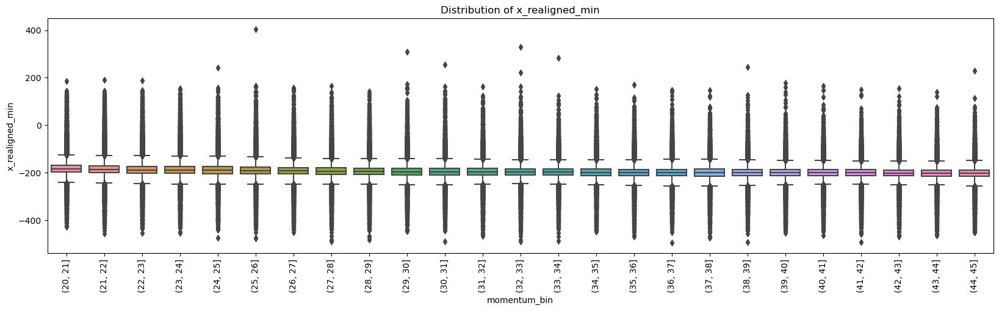

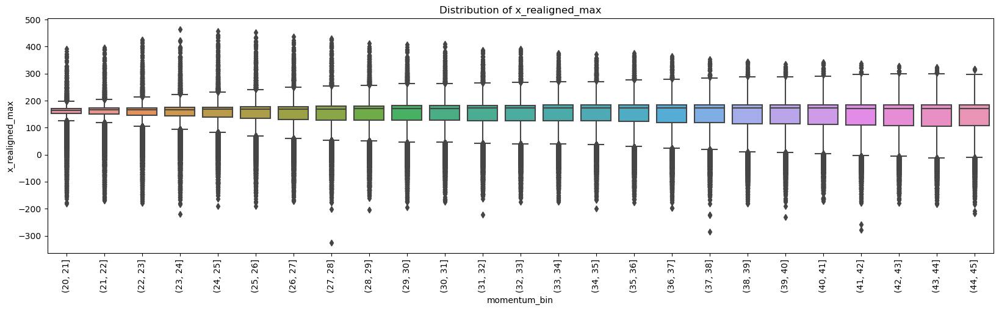

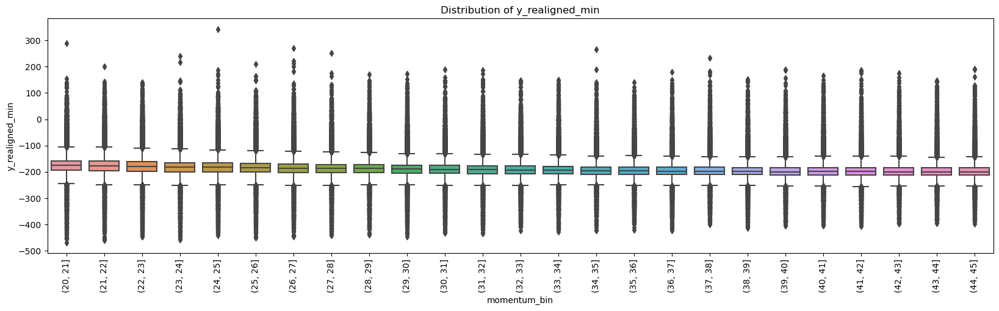

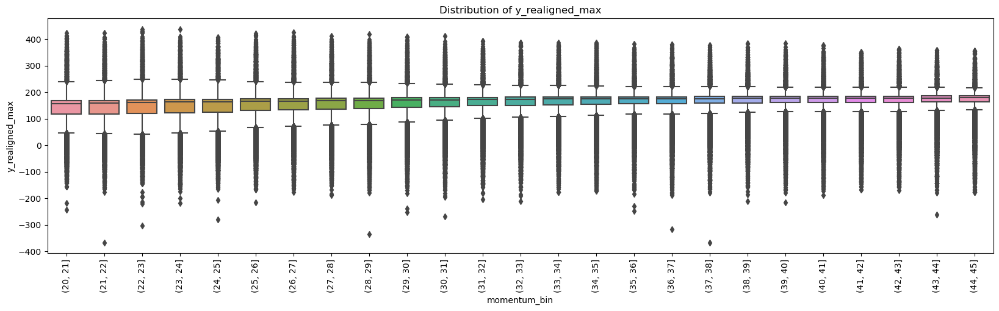

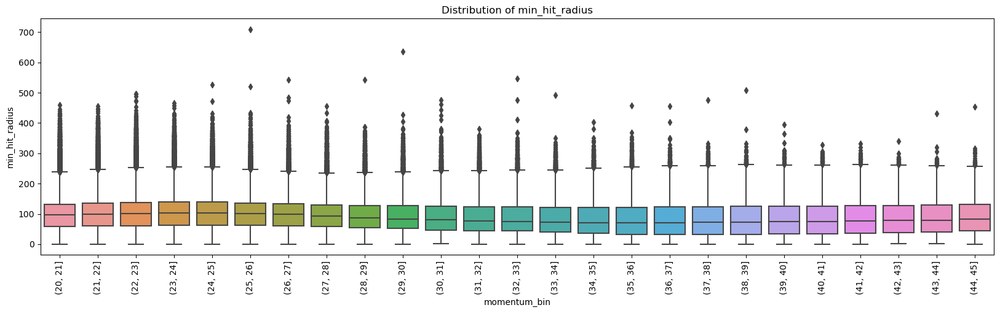

...

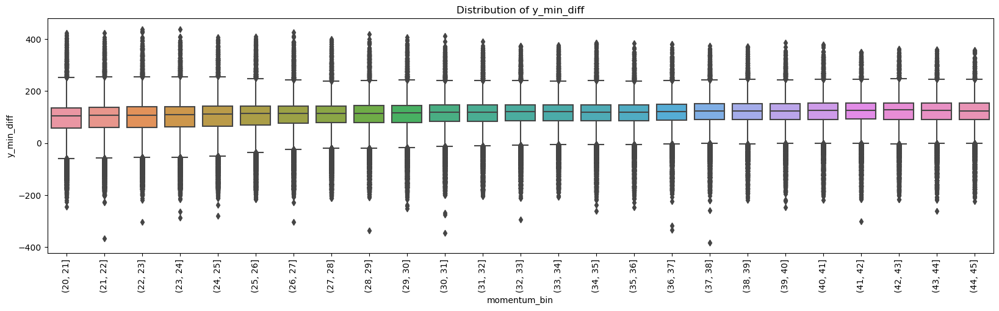

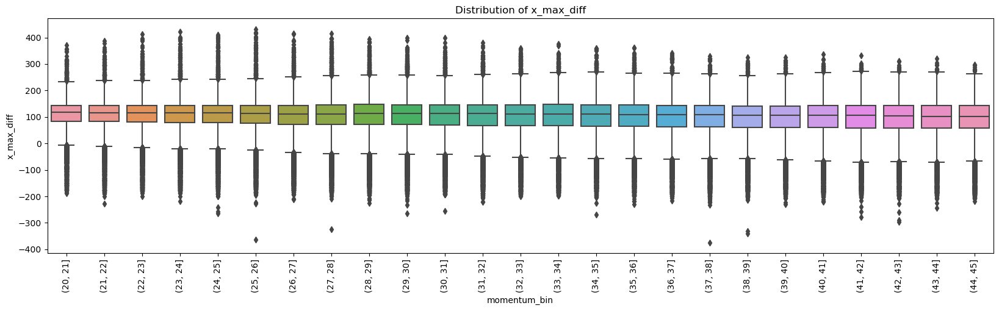

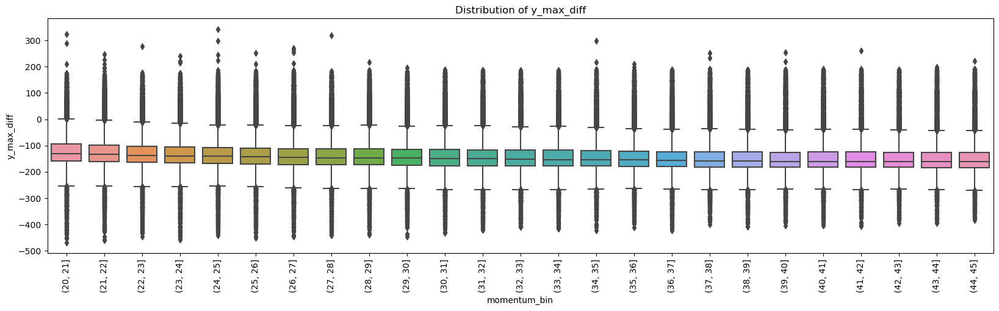

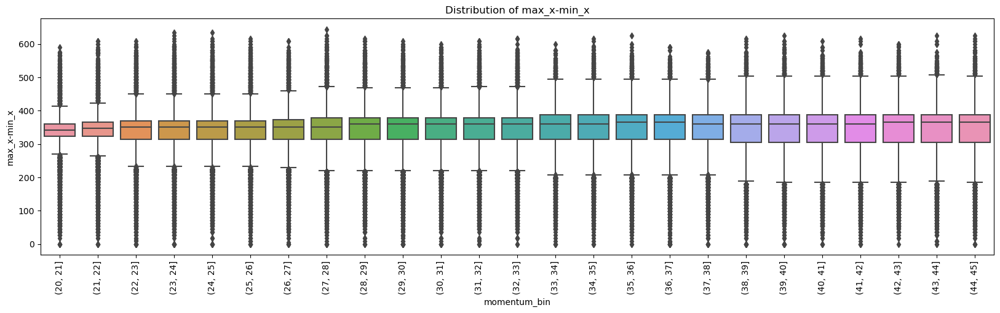

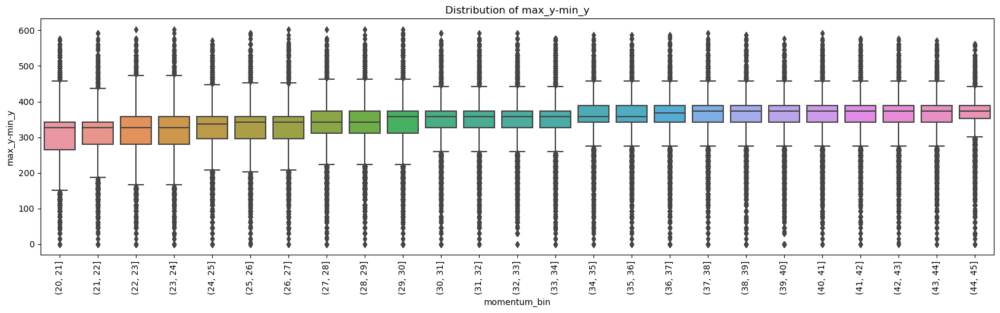

In [28]:
for i in range(1,20):
    sns.boxplot(data = grouped_hit_data, x = 'momentum_bin', y = grouped_hit_data.columns[i]).set(title = f'Distribution of {grouped_hit_data.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()


### 3.2 Boxplots of each feature vs. calculated radius bins 

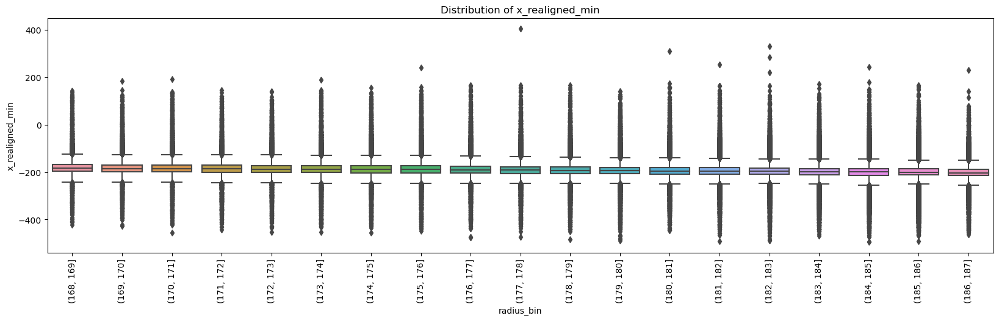

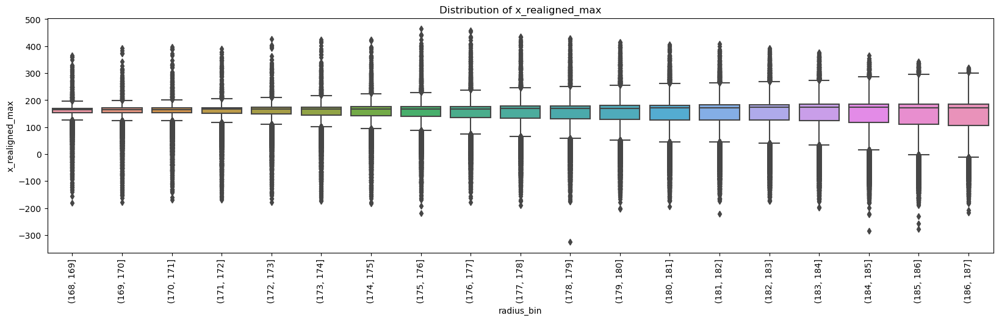

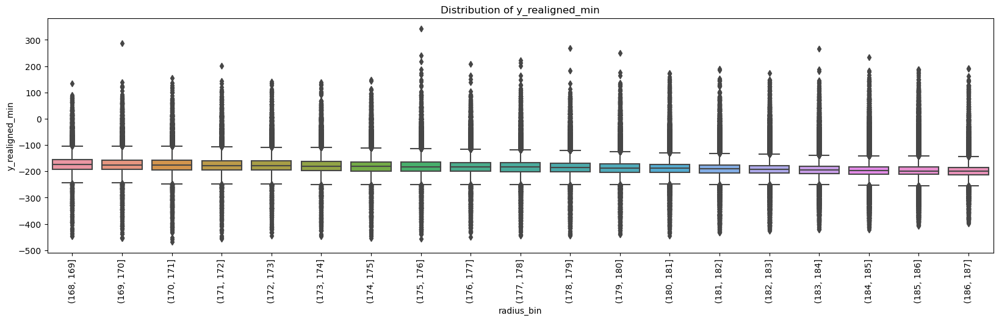

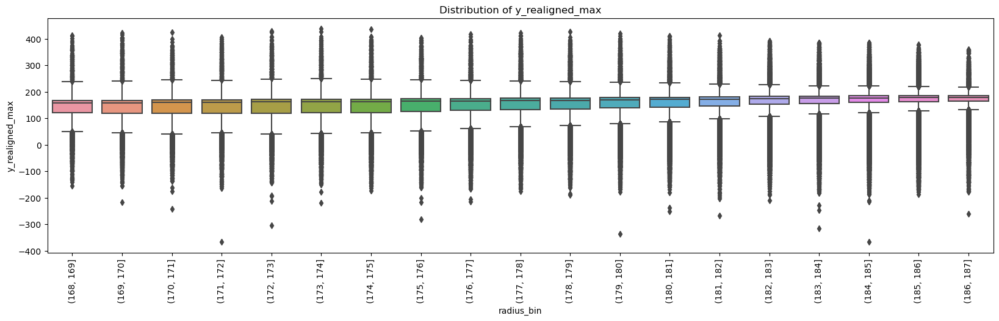

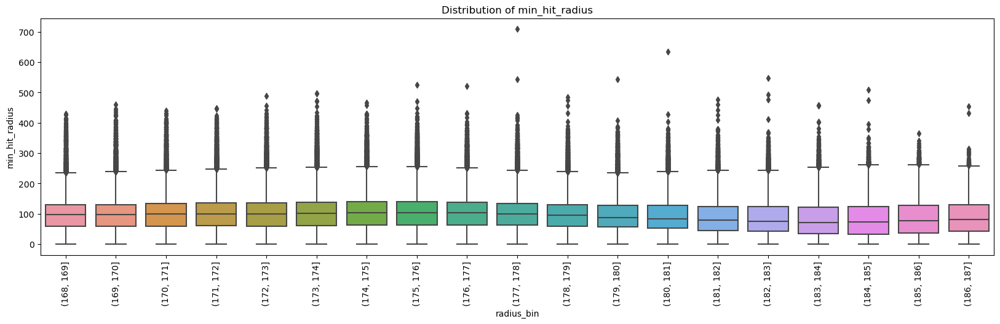

...

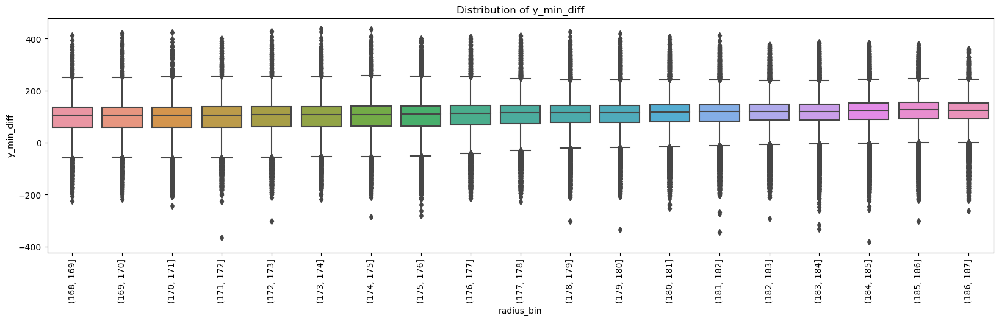

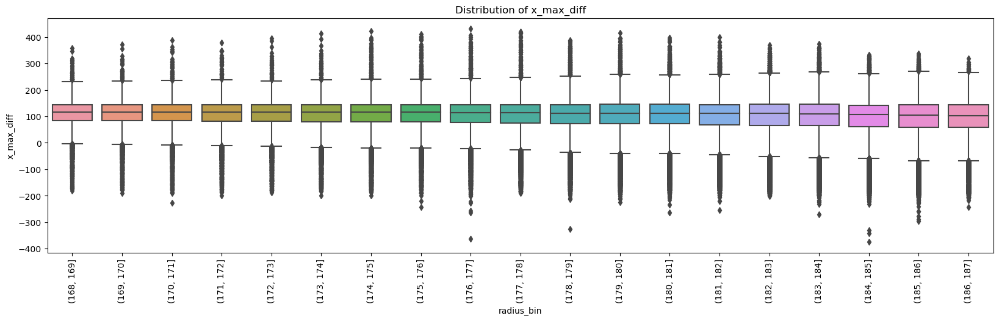

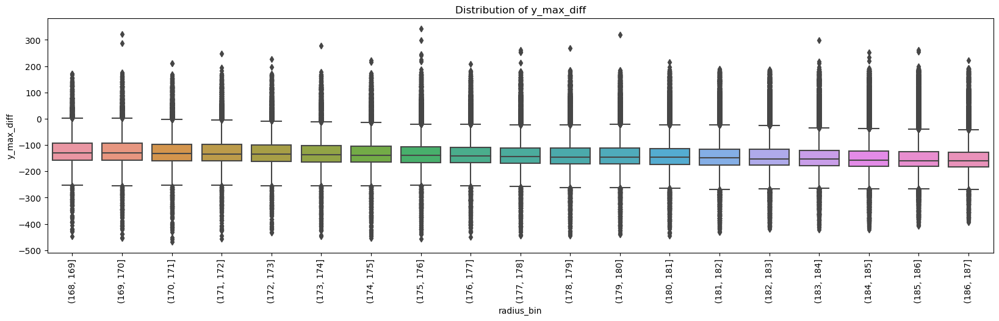

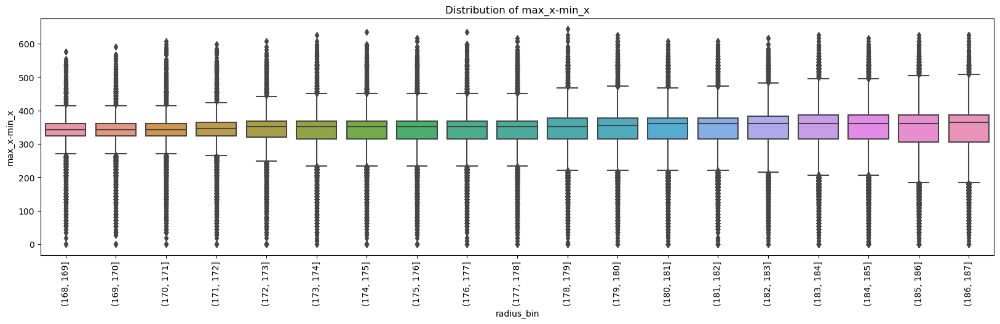

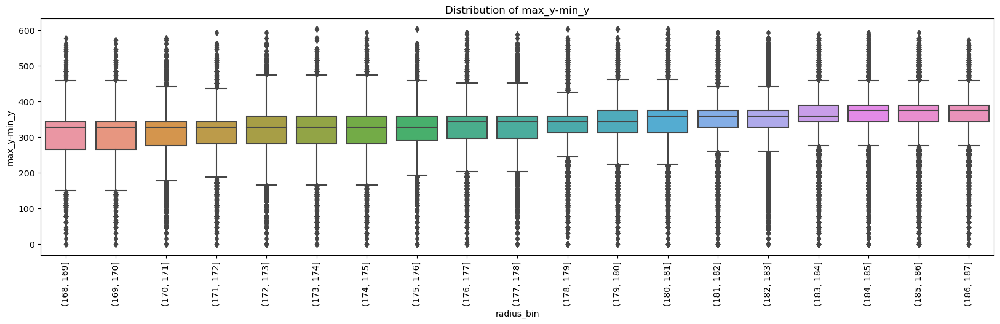

In [29]:
for i in range(1,20):
    sns.boxplot(data = grouped_hit_data, x = 'radius_bin', y = grouped_hit_data.columns[i]).set(title = f'Distribution of {grouped_hit_data.columns[i]}')

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.xticks(rotation = 90)
    plt.show()

#### Slice the data with momentum range from 20 to 25 GeV/c

In [30]:
grouped_hit_data_slice = grouped_hit_data.query('track_momentum >= 20 & track_momentum <= 25')

In [31]:
bins_slice = np.arange(168, 178, 1)
grouped_hit_data_slice['radius_bin_slice'] = pd.cut(grouped_hit_data_slice['ring_radius_cal'], bins=bins_slice)

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_11053/3206556281.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped_hit_data_slice['radius_bin_slice'] = pd.cut(grouped_hit_data_slice['ring_radius_cal'], bins=bins_slice)


### 3.3 Histograms showing distribution of each feature, faceted by radius bins using data sliced for momentum in range 20-25 GeV/c

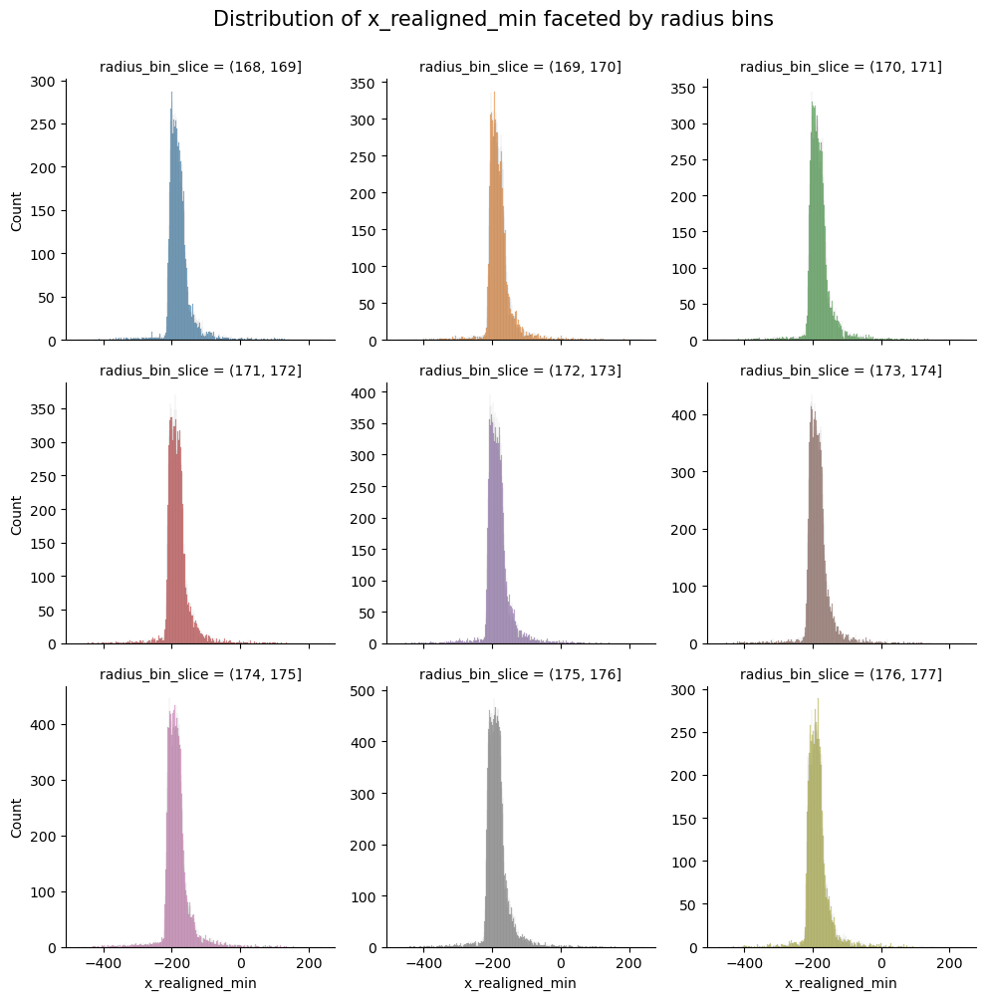

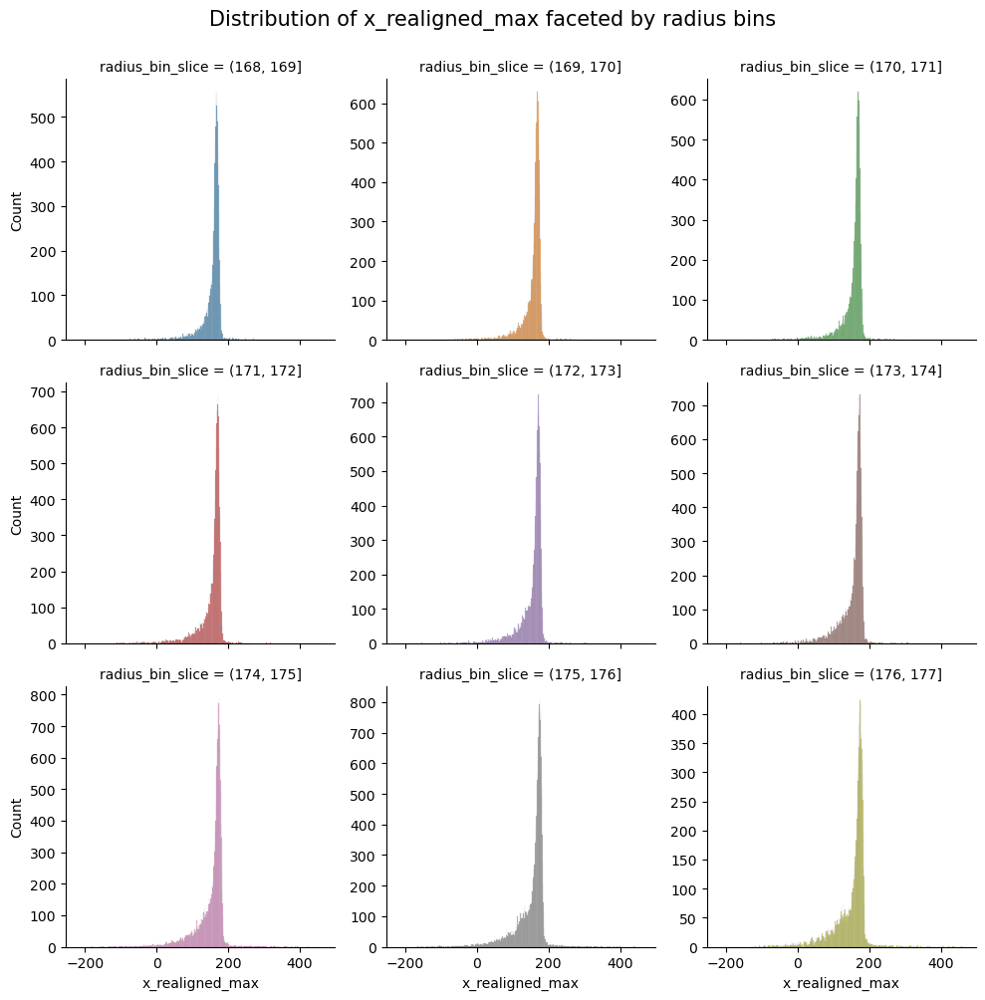

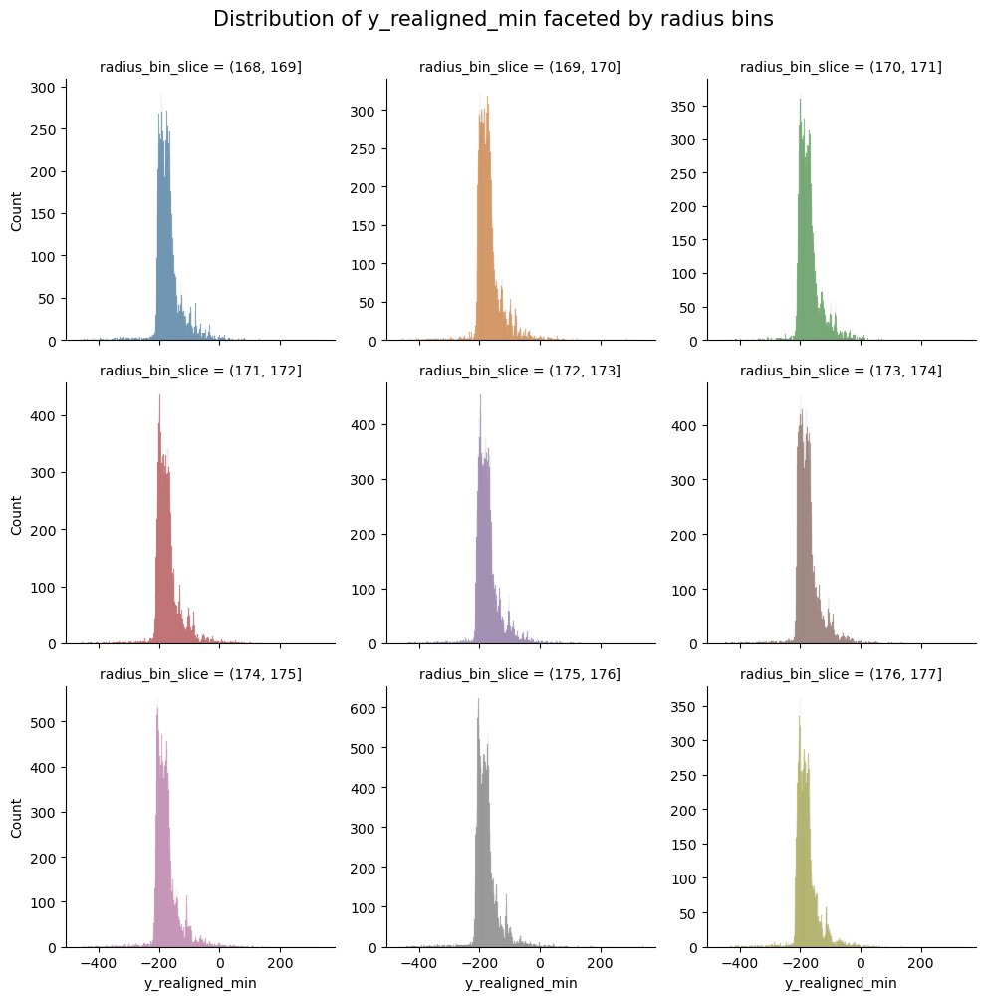

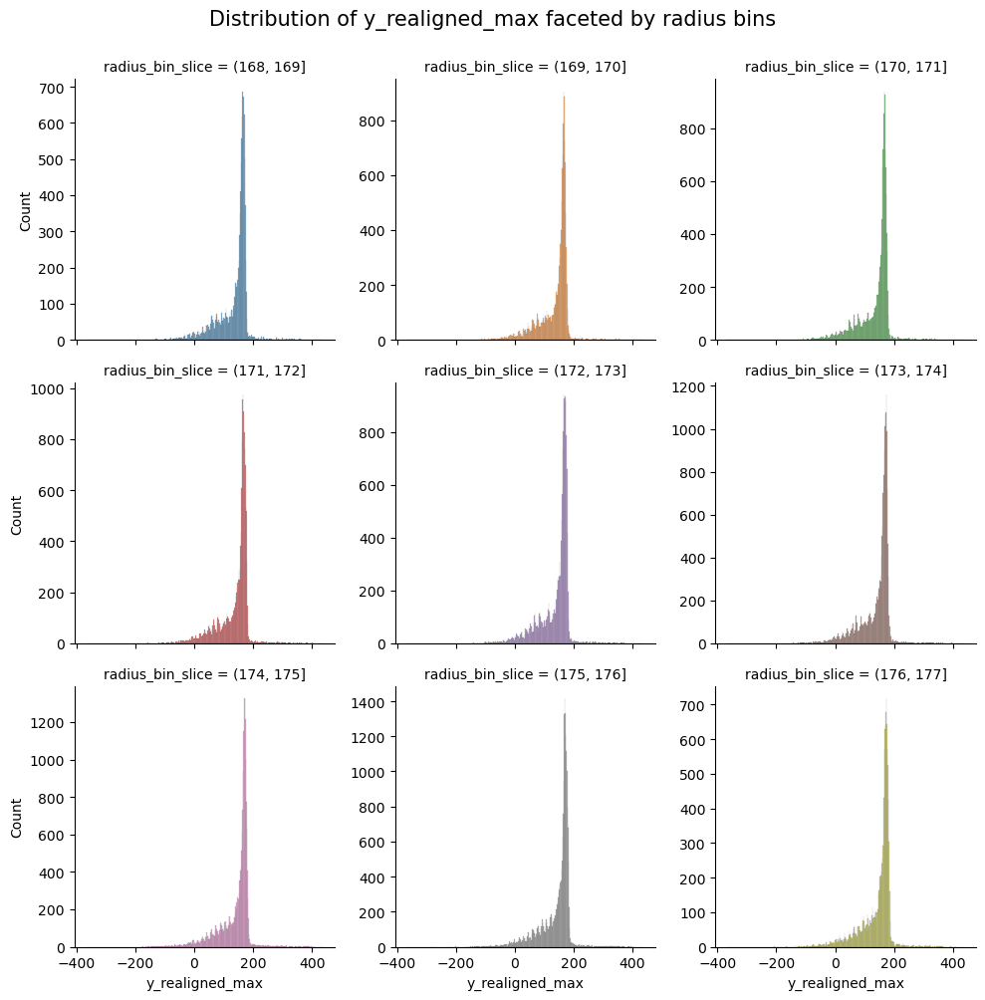

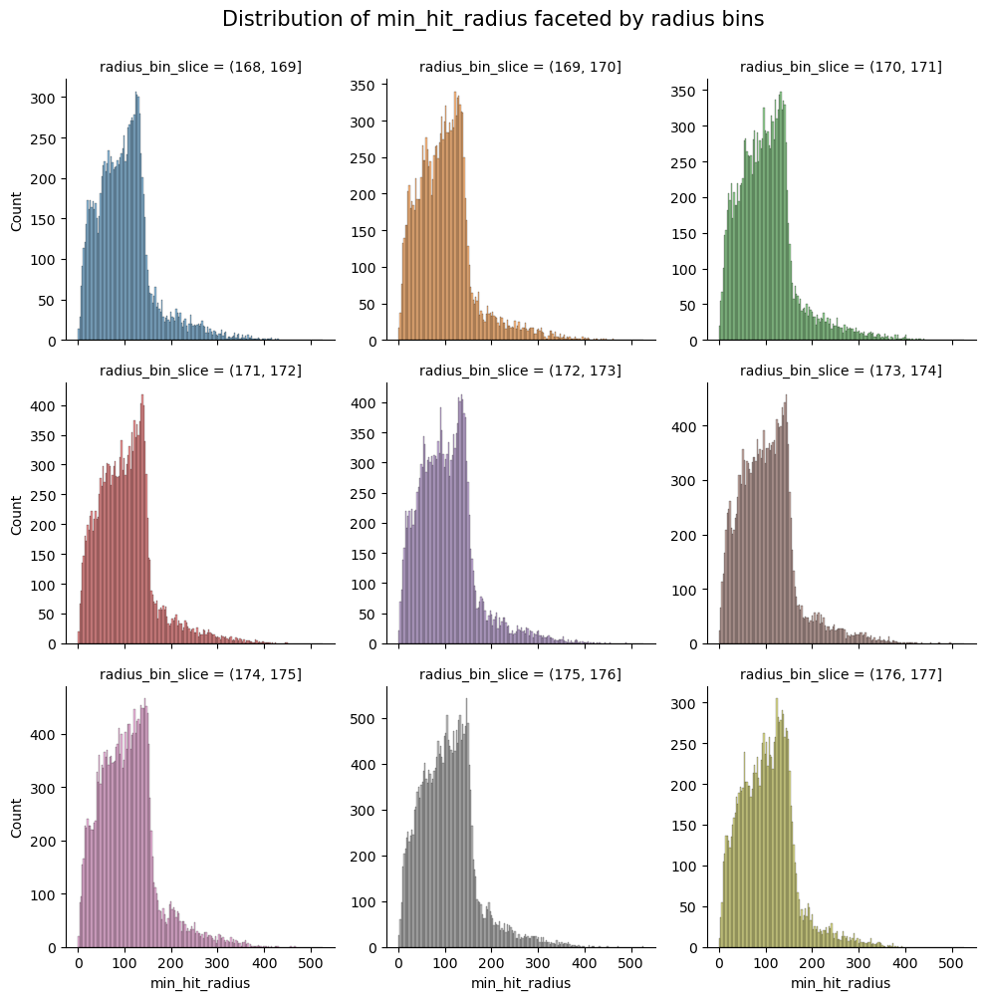

...

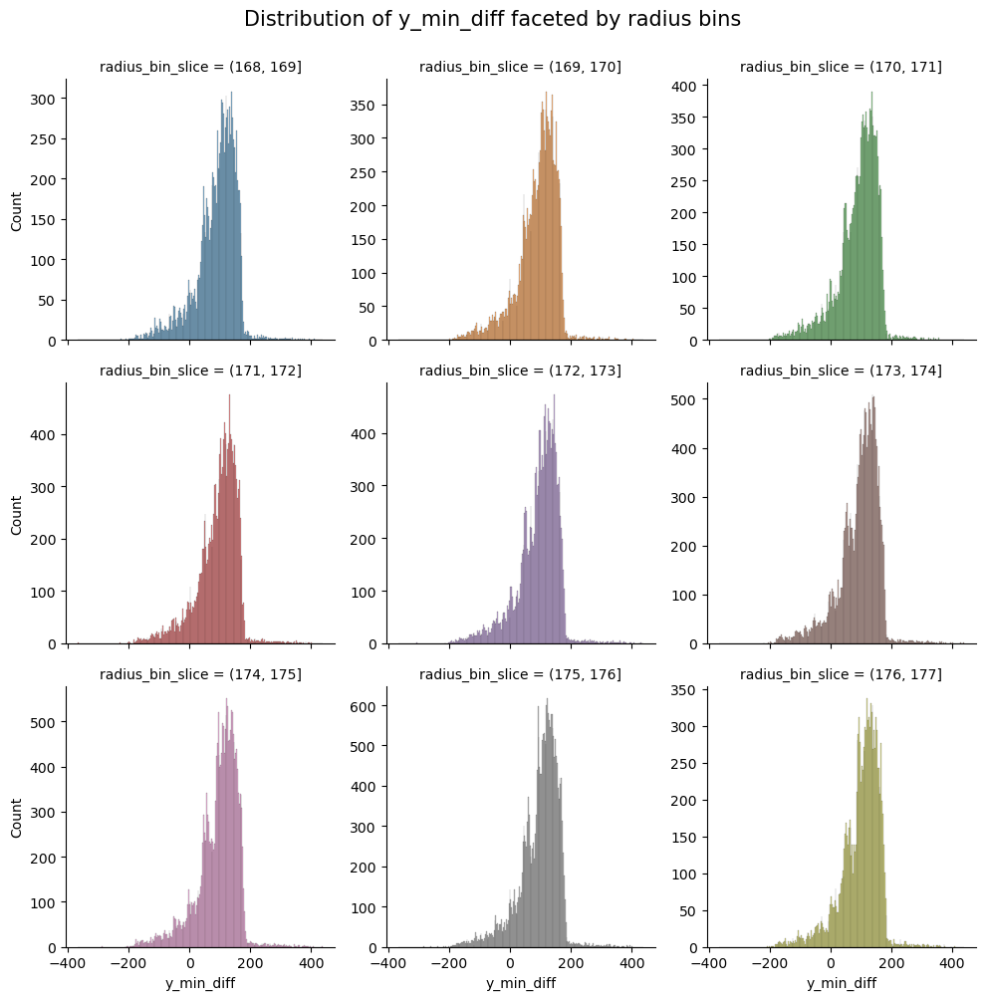

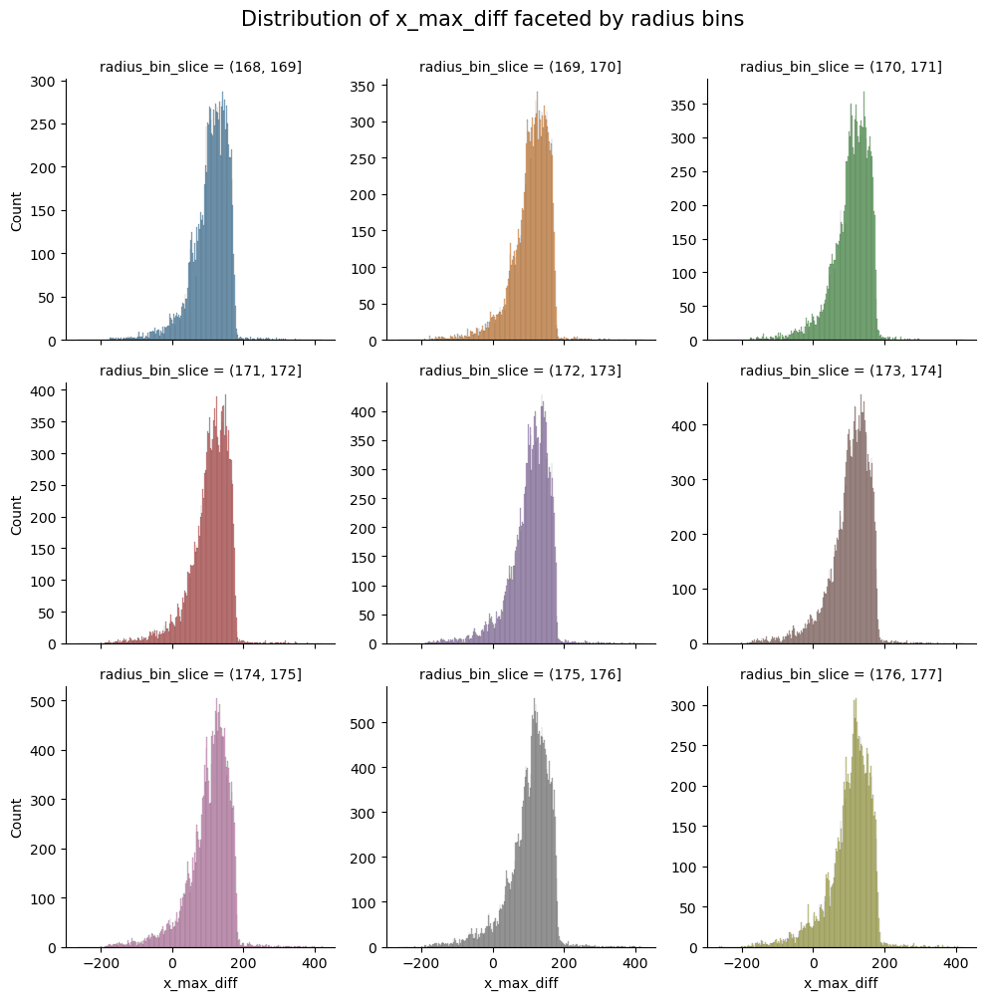

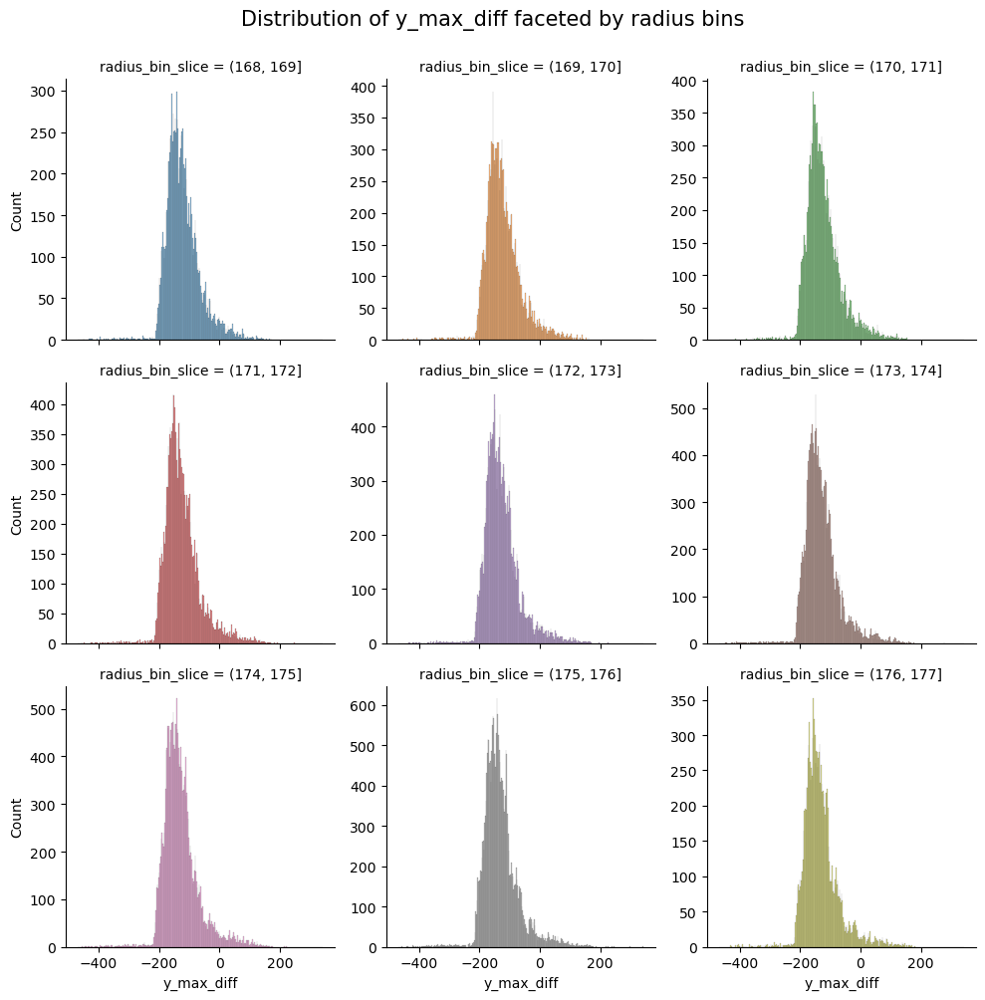

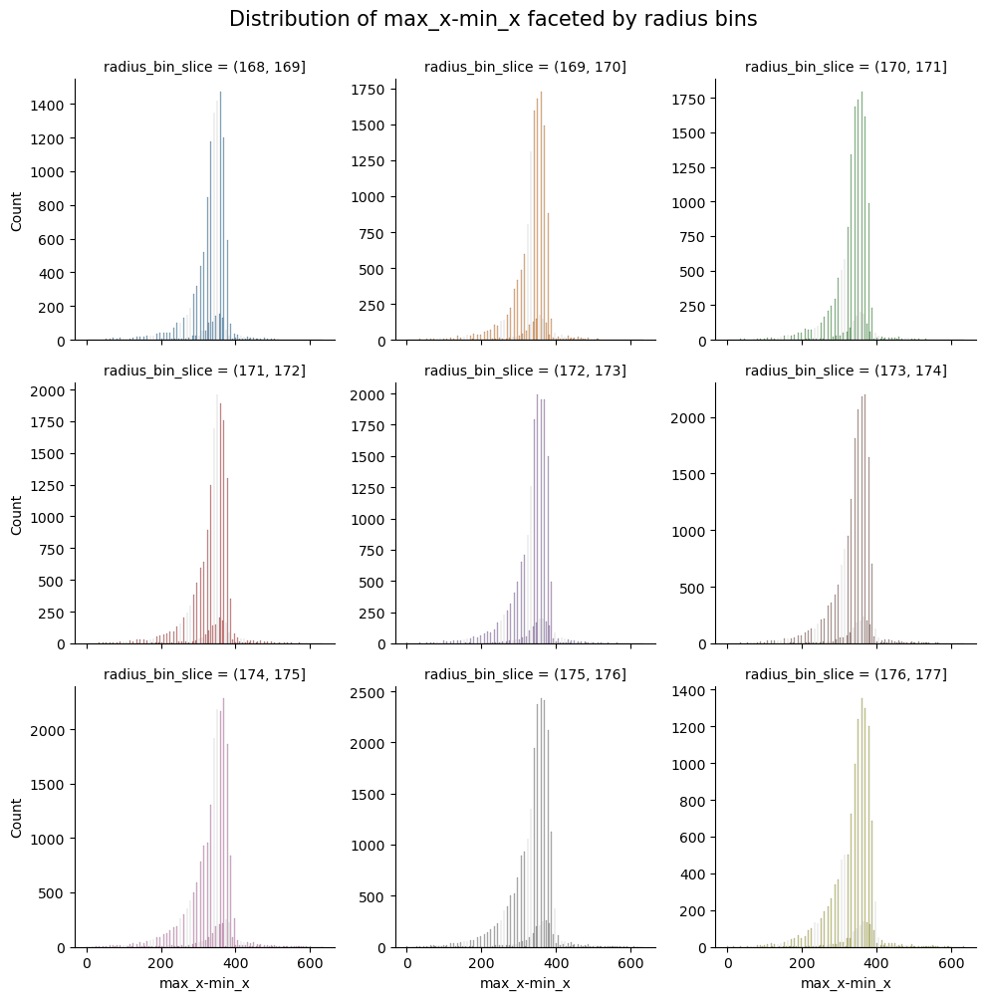

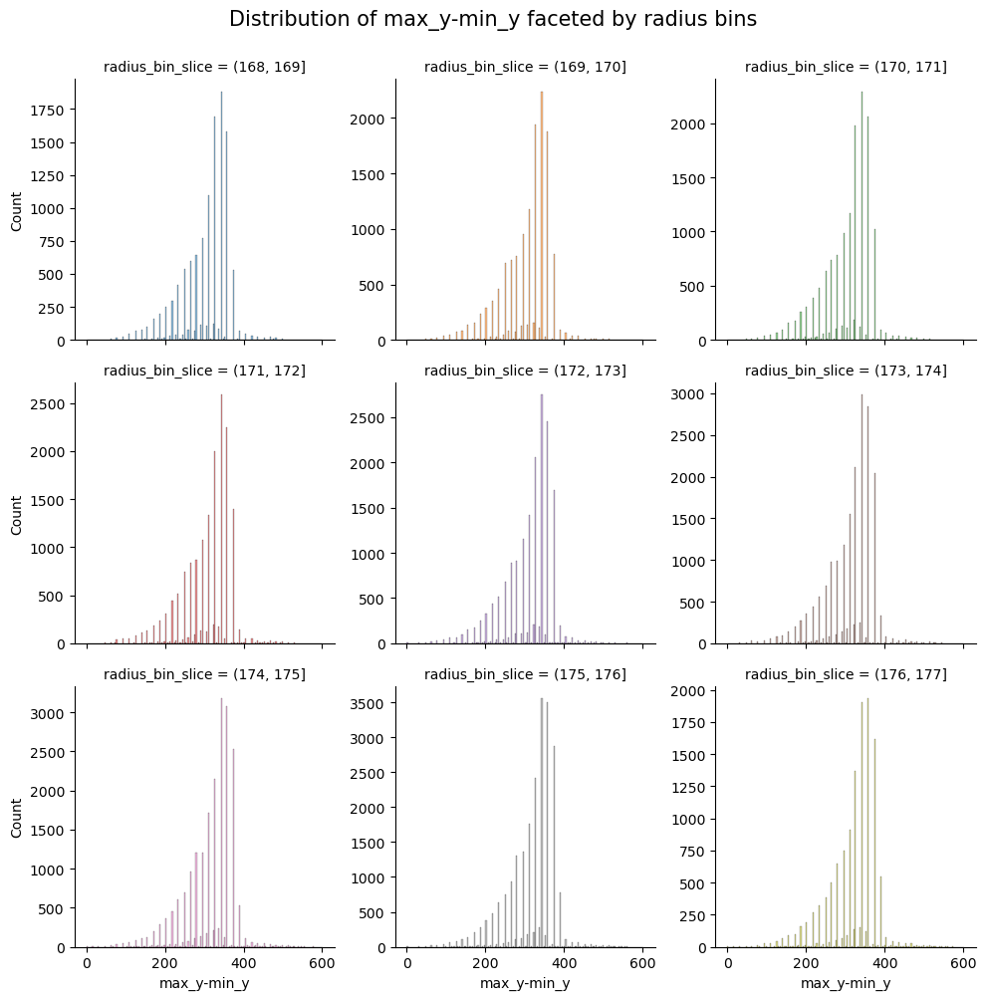

In [32]:
for i in range(1, 20):

    g = sns.displot(
        data=grouped_hit_data_slice,
        x=grouped_hit_data_slice.columns[i],
        hue="radius_bin_slice",
        col='radius_bin_slice',
        col_wrap=3,
        facet_kws=dict(sharey=False),
        legend=False
)

    g.fig.suptitle(f"Distribution of {grouped_hit_data_slice.columns[i]} faceted by radius bins", y=1, fontsize=15)
    g.set_titles(size=10)
    g.set_ylabels(fontsize=10)
    g.fig.set_figheight(10)
    g.fig.set_figwidth(10)

    
    plt.tight_layout()
    plt.show()

### 3.4 Scatter plot showing calculated ring radius vs. all the features with data sliced for momentum in range 20-25 GeV/c

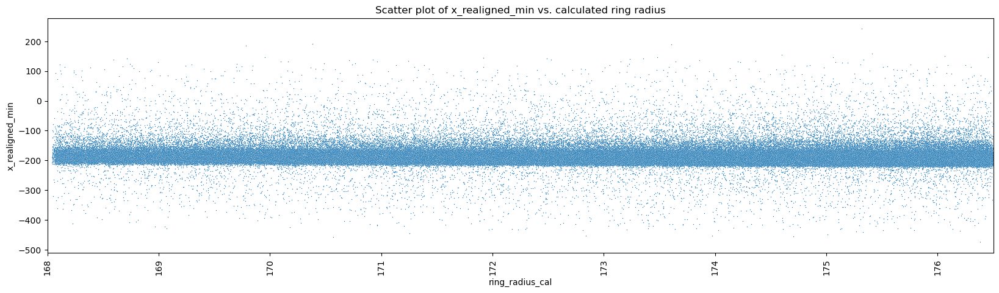

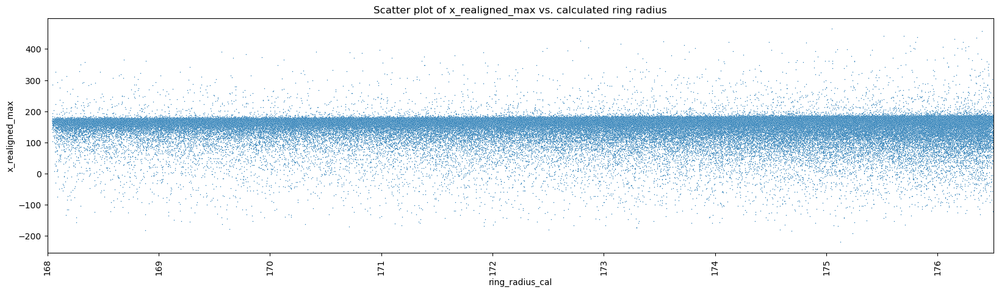

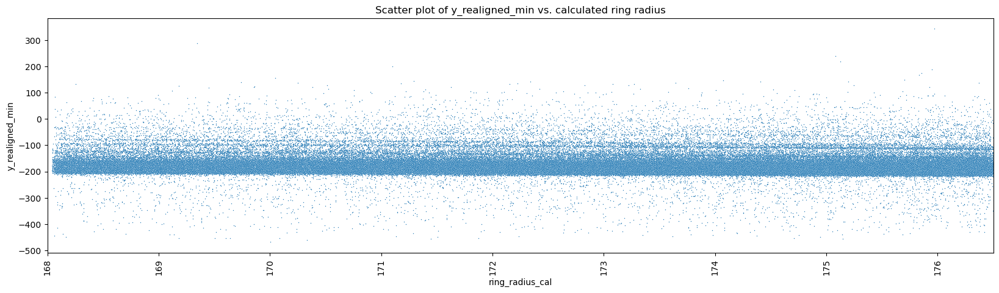

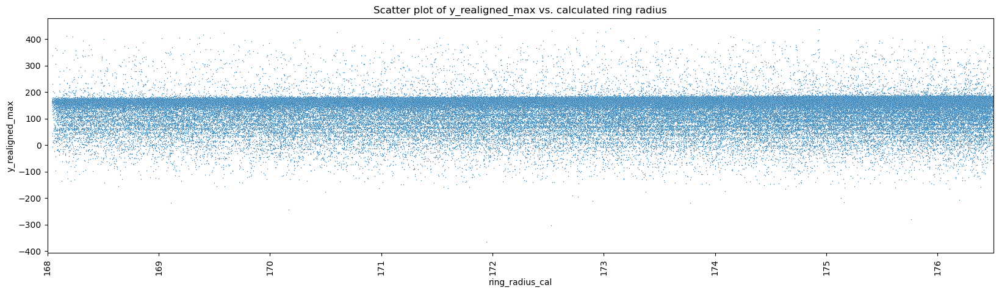

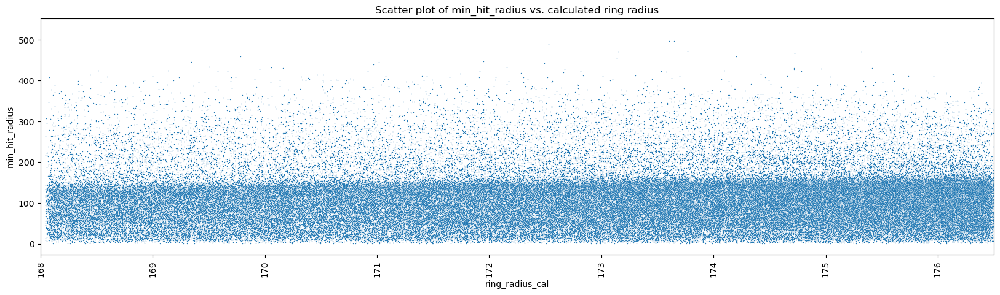

...

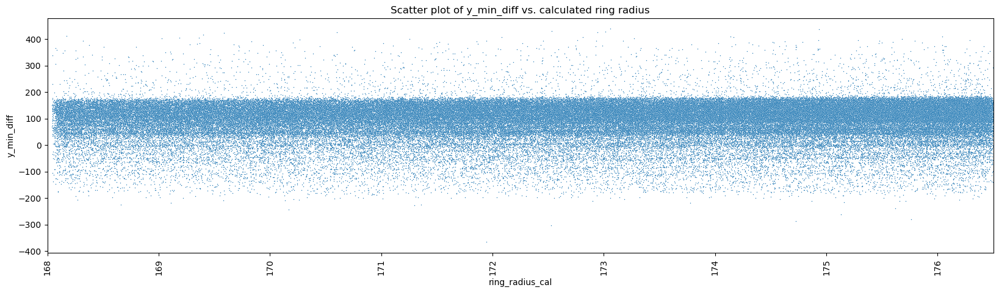

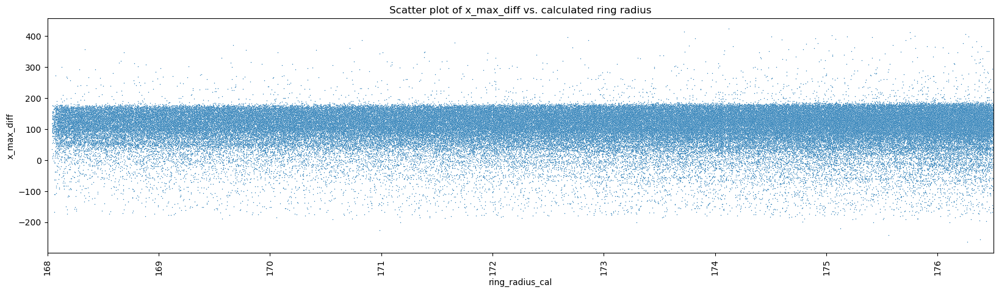

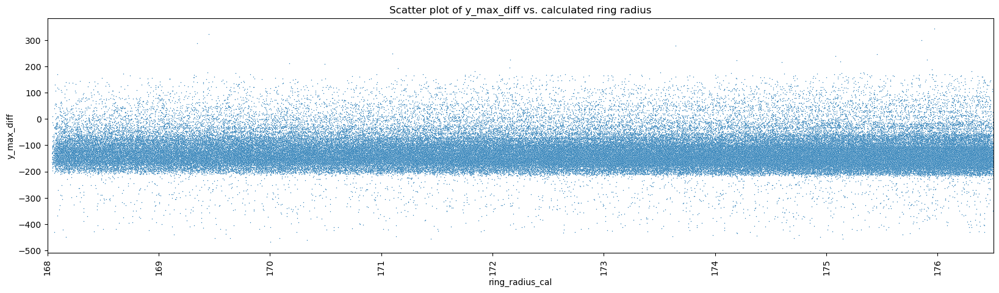

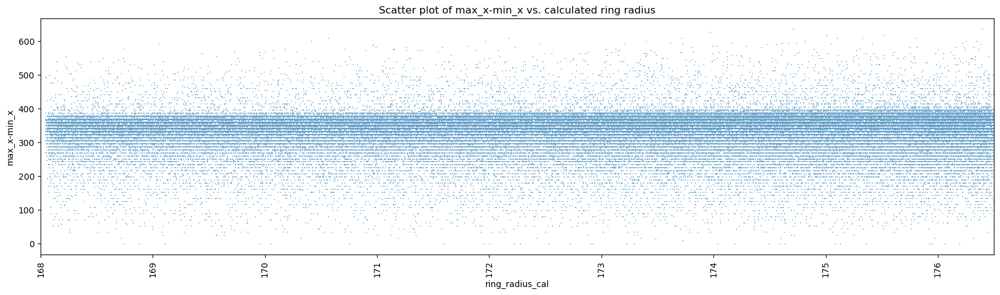

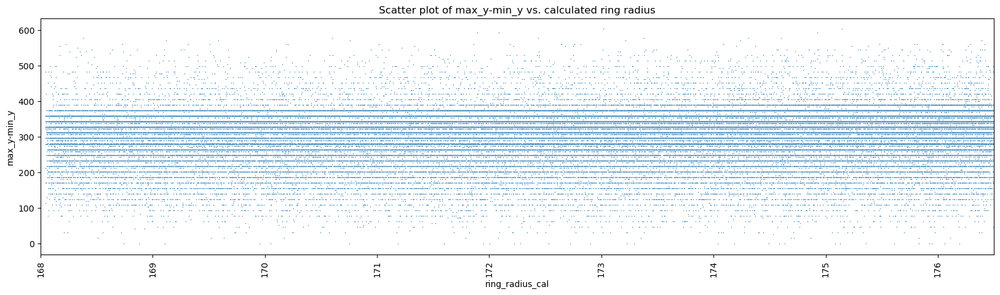

In [33]:
for i in range(1,20):
    g = sns.scatterplot(data = grouped_hit_data_slice, x = 'ring_radius_cal', y = grouped_hit_data.columns[i], s=1)
    g.set(xlim = (168, 176.5))

    fig = plt.gcf()
    fig.set_size_inches(20, 5)
    plt.title(f'Scatter plot of {grouped_hit_data.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


### 3.5 2D histograms showing calculated ring radius vs. all the features with data sliced for momentum in range 20-25 GeV/c

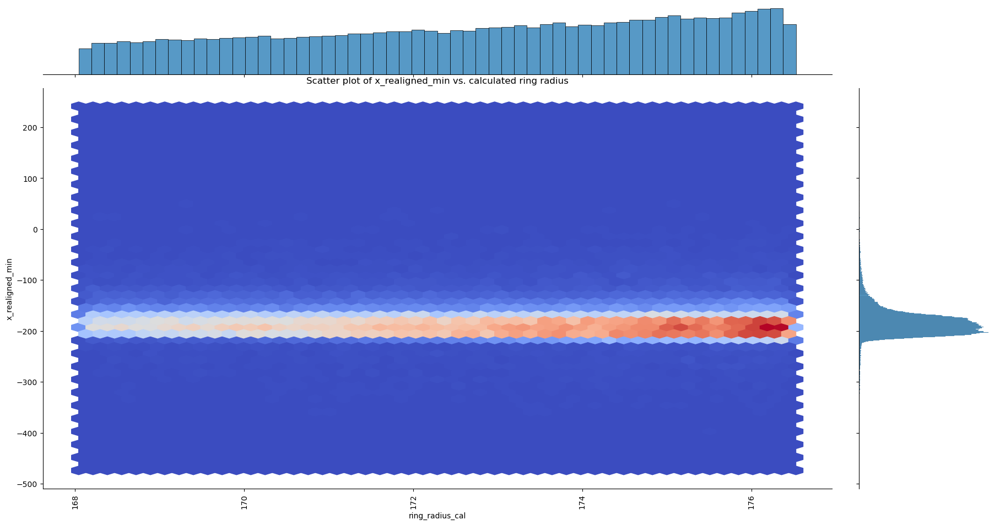

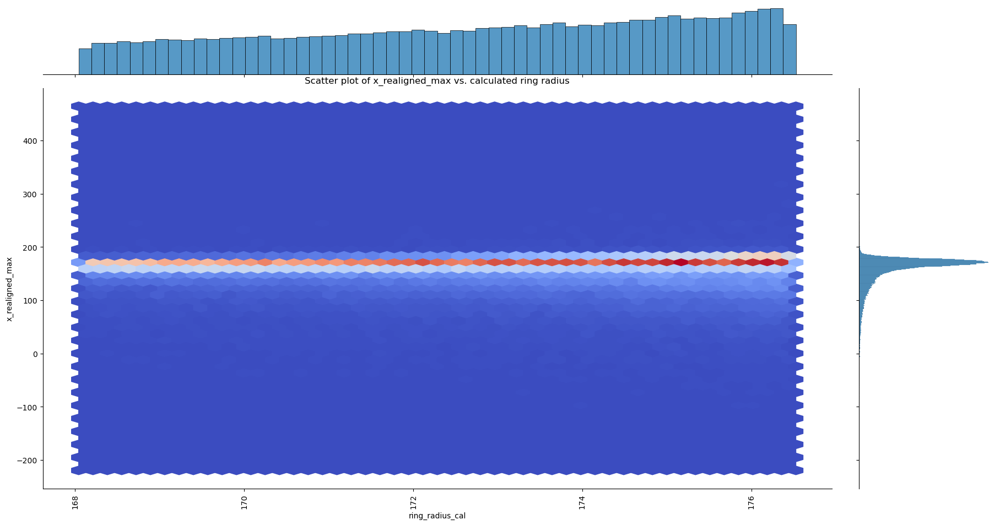

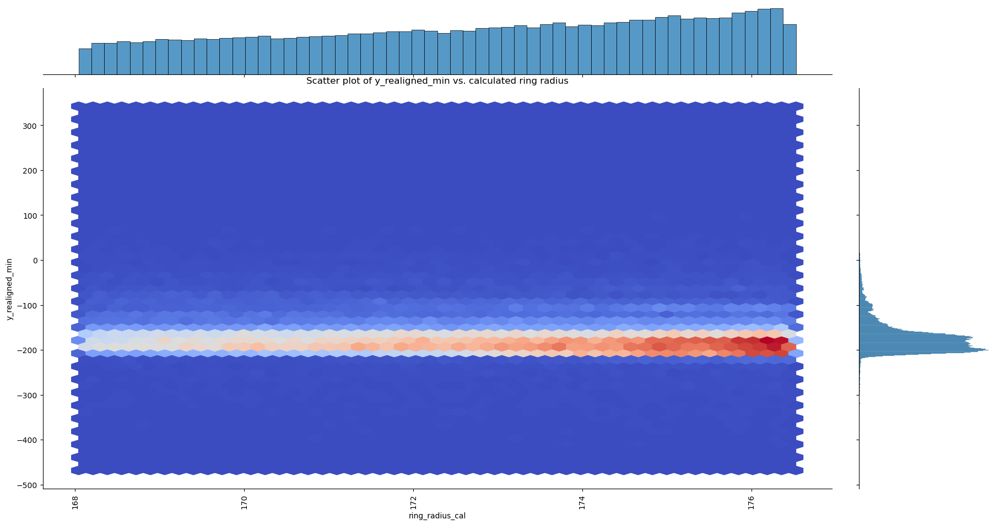

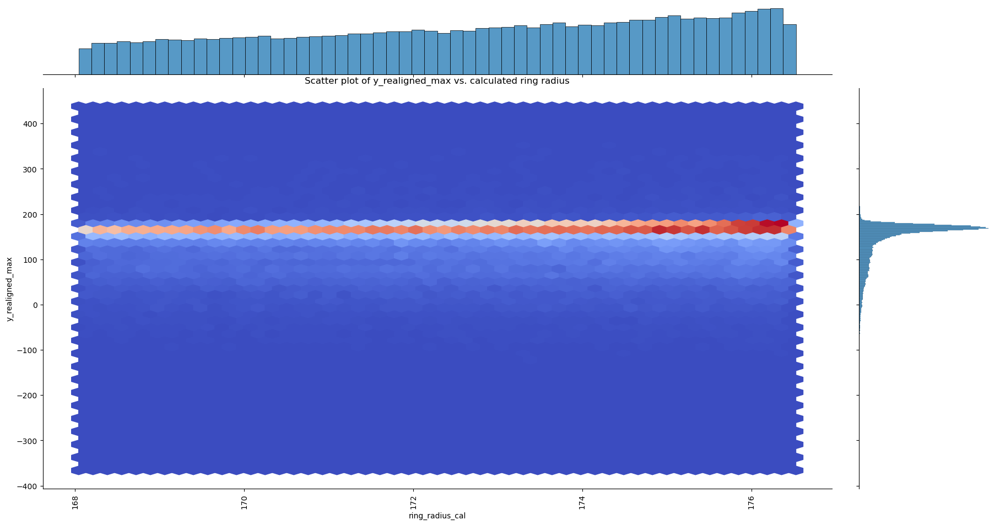

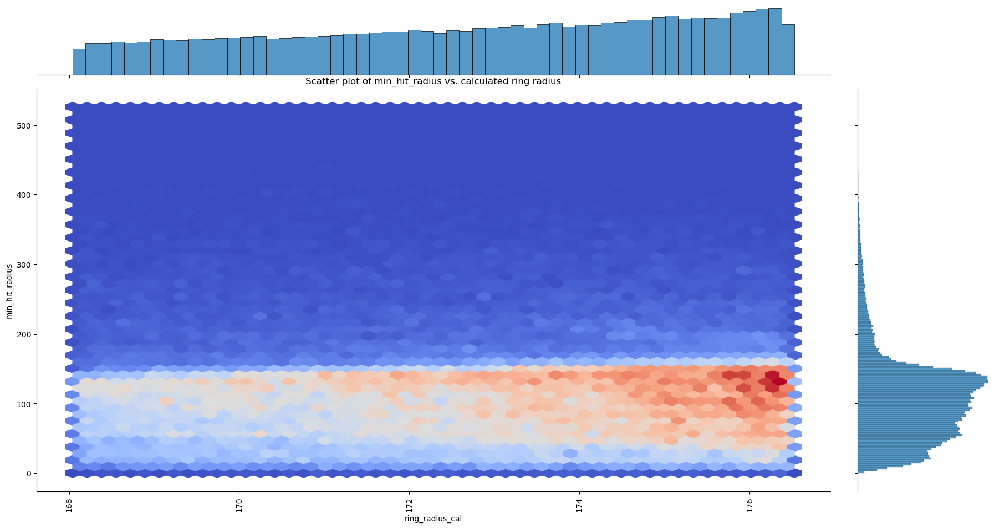

...

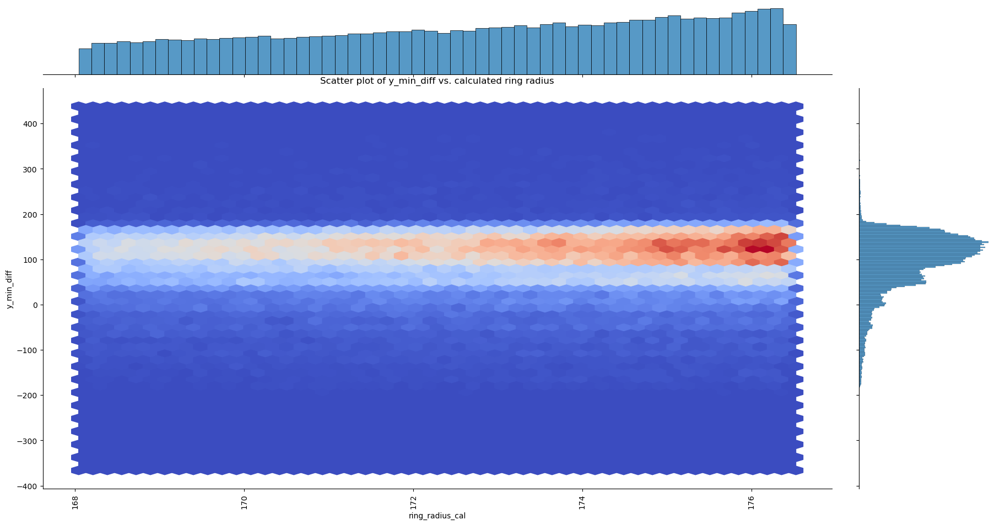

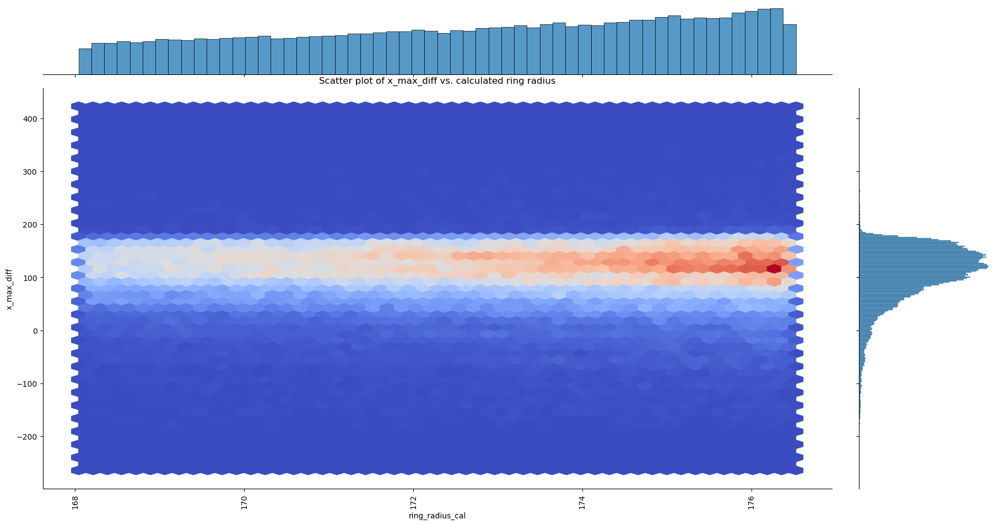

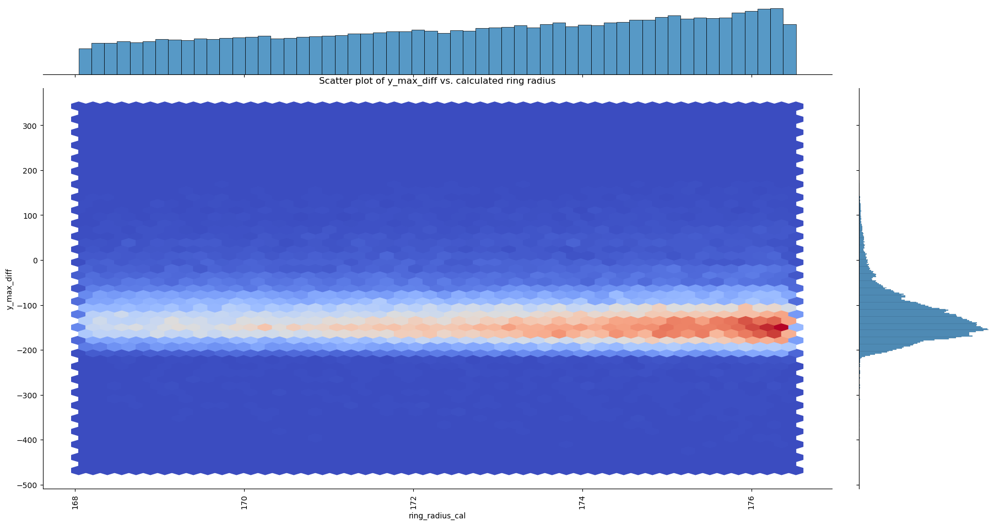

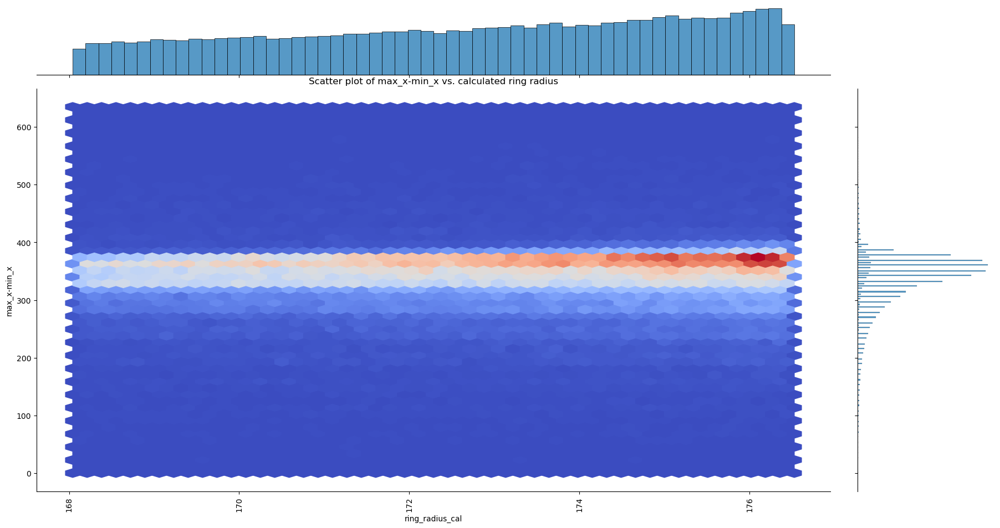

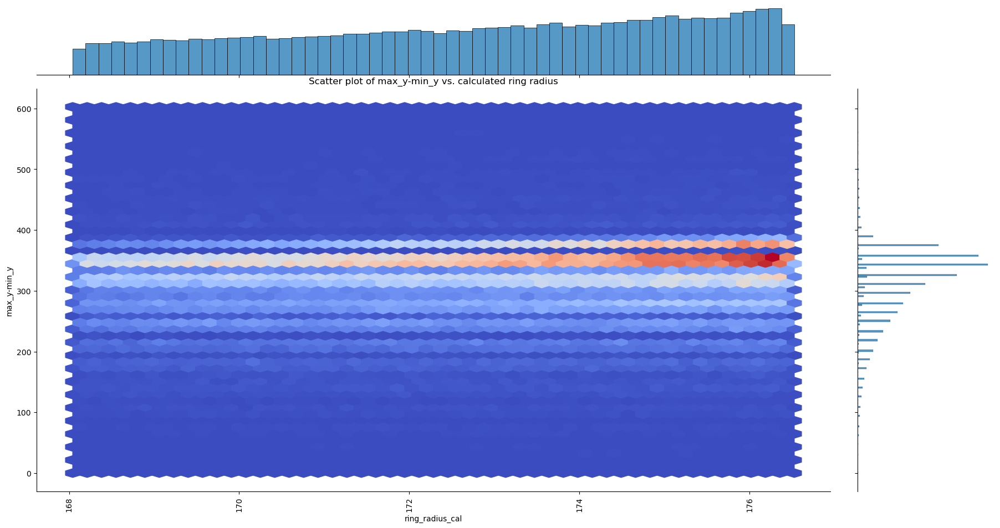

In [34]:
for i in range(1,20):
    g = sns.jointplot(data=grouped_hit_data_slice, x = 'ring_radius_cal', y = grouped_hit_data.columns[i], kind='hex', cmap='coolwarm')
    # g.set(xlim = (168, 176.5))

    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    plt.title(f'Scatter plot of {grouped_hit_data.columns[i]} vs. calculated ring radius')
    plt.xticks(rotation = 90)
    plt.show()


## 4. Training 

#### Section 4 contains the following sub-sections:

- 4.1 Performance of `XGBRegressor` with default hyperparameters 

- 4.2 Hyperparameter optimization on `XGBRegressor`
- 4.3 Performance of optimized `XGBRegressor` with `Dart` booster 
- 4.4 Performance of optimized `XGBRegressor` with features transformed by `PolynomialFeatures` 
- 4.5 Performance of optimized `XGBRegressor` with top two important features only (`max_y-min_y` and `rms_hit_radius`) 
- 4.6 Comparison of the residuals between the optimized `XGBRegressor` and SOTA
- 4.7 Plots showing relationship between `track_momentum` and calculated ring radius vs. `rms_hit_radius`
- 4.8 Plots of residual ditribution from `XGBRegressor` in 5 radius bins 
- 4.9 Performance comparison with `RandomForestRegressor`
- 4.10 Performance comparison with `LightGBM`
- 4.11 Performance comparison with `CatBoostRegressor` 
- 4.12 Correlation heatmap between features


### 4.1 Testing the model with default hyperparameters 

#### Train test split 

In [35]:
train_df, test_df = train_test_split(grouped_hit_data, random_state=42)

In [36]:
X_train = train_df.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_train = train_df['ring_radius_cal']
X_test = test_df.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_test = test_df['ring_radius_cal']

#### 4.1.1 Fitting the `XGBRegressor` model

In [37]:
xgb_reg = xgb.XGBRegressor()

In [38]:
reg_metrics = ['neg_root_mean_squared_error', 'r2']

In [39]:
from sklearn.model_selection import cross_val_score, cross_validate, RandomizedSearchCV

In [40]:
xgb_reg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.1.2 Cross validate

In [41]:
xgb_cv = cross_validate(xgb_reg, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [42]:
pd.DataFrame(xgb_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,19.959713,0.036012,-2.307218,-2.215070,0.769396,0.789007
1,21.019391,0.040687,-2.309782,-2.208645,0.768873,0.790232
2,20.620507,0.034982,-2.318709,-2.214585,0.769648,0.788518
3,21.280884,0.033065,-2.307670,-2.213373,0.771883,0.788739
4,21.321400,0.033648,-2.303204,-2.203533,0.771832,0.790829


#### 4.1.3 Predict and score on the test set

In [43]:
from sklearn.metrics import r2_score

In [44]:
ypred = xgb_reg.predict(X_test)
r2 = r2_score(y_test, ypred)
r2

0.769627997916619

In [45]:
pred_df = pd.DataFrame(ypred, y_test).reset_index()
pred_df.columns=['predicted_radius', 'theoretical_radius']

In [46]:
pred_df

,predicted_radius,theoretical_radius
0,181.767956,180.982574
1,173.556621,179.208862
2,184.824704,184.490768
3,182.987862,182.275269
4,181.937097,181.169098
...,...,...
194350,181.324880,182.111343
194351,175.800870,179.030075
194352,177.731352,177.190979
194353,184.887268,181.044220


#### 4.1.4 Plotting feature importance 

In [47]:
pd.DataFrame({'features': xgb_reg.feature_names_in_, 'importance': xgb_reg.feature_importances_}).sort_values(by='importance', ascending=False)

,features,importance
18,max_y-min_y,0.143244
8,rms_hit_radius,0.127837
1,x_realigned_max,0.098129
3,y_realigned_max,0.089836
2,y_realigned_min,0.067773
11,x_max_sum,0.066479
12,y_max_sum,0.053943
0,x_realigned_min,0.048376
6,mean_hit_radius,0.048026
16,y_max_diff,0.043605


#### 4.1.5 Computing the residuals

In [48]:
pred_df['residual'] = pred_df['theoretical_radius'] - pred_df['predicted_radius']

Text(0, 0.5, 'Residuals')

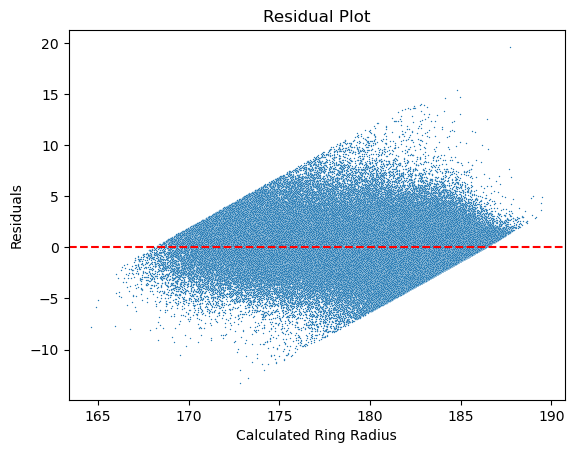

In [186]:
sns.scatterplot(data=pred_df, x='theoretical_radius', y='residual', s=1)

plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

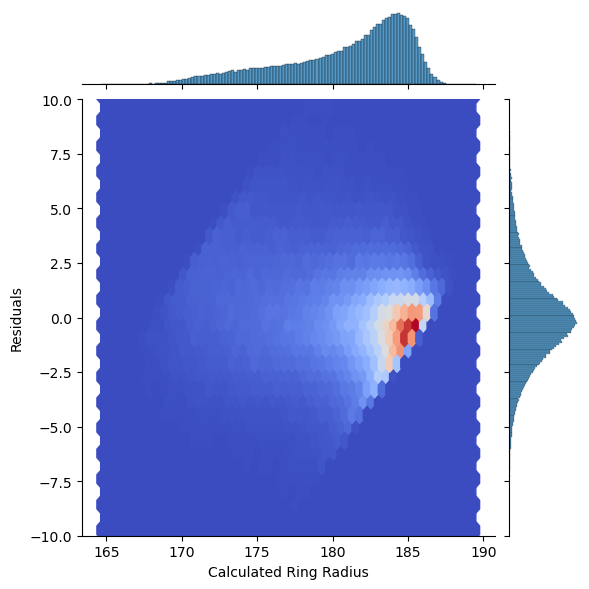

In [187]:
g = sns.jointplot(data=pred_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim = (-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.2 Hyperparameter optimization 

#### Subsetting a smaller sample for hyperparameter optimization

In [51]:
samples_per_bin = 3000

sampled_group = grouped_hit_data.groupby('momentum_bin').apply(lambda x: x.sample(samples_per_bin, random_state=42)).reset_index(drop=True)

sampled_group.reset_index(drop=True, inplace=True)


In [52]:
train_df_subset, test_df_subset = train_test_split(sampled_group, random_state=42)

In [53]:
X_train_subset = train_df_subset.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_train_subset = train_df_subset['ring_radius_cal']
X_test_subset = test_df_subset.drop(columns=['ring_radius_cal','event', 'track_momentum', 'momentum_bin', 'radius_bin'])
y_test_subset = test_df_subset['ring_radius_cal']

#### Hyperparameters included:
- `max_depth`: the maximum depth of trees 
- `learning_rate`: the rate at which each new tree modifies the overall model
- `reg_lambda`: the degree of L2 regularization
- `reg_alpha`: the degree of L1 regularization 
- `n_estimators`: number of trees included in the model 

In [54]:
param_grid = {
    "max_depth": [4, 6, 8, 10],
    "learning_rate": [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 0.7],
    "reg_lambda": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
    "reg_alpha": [0, 0.1, 0.3, 0.5, 0.7, 0.9],
    "n_estimators": [100, 300, 500, 700, 900]
}

xgb_tune = XGBRegressor()

random_search = RandomizedSearchCV(
    estimator=xgb_tune,
    param_distributions=param_grid,
    scoring="r2",
    n_iter=20,
    cv=5,
    random_state=42
)

random_search.fit(X_train_subset, y_train_subset)

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_iter=20,
                   param_distributions={'learning_rate': [0.001, 0.01, 0.05,
                                                          0.1, 0.3, 0.5, 0.7],
                                        'max_depth': [4, 6, 8, 10],
                                        'n_estimators': [100, 300, 500, 700,
                                                         900],
                                        'reg_alpha': [0, 0.1, 0.3, 0.5, 0.7,
                                                      0.9],
                                        'reg_lambda': [0, 0.1, 0.3, 0.5, 0.7,
                                                       0.9]},
                   random_state=42, scoring='r2')

In [55]:
best_params = random_search.best_params_
best_score = random_search.best_score_

In [56]:
best_params

{'reg_lambda': 0.5,
 'reg_alpha': 0.5,
 'n_estimators': 500,
 'max_depth': 6,
 'learning_rate': 0.1}

In [57]:
best_score

0.7633702162196536

#### 4.2.1 Showing cv scores on the optimized hyperparameters

In [58]:
xgb_opt = xgb.XGBRegressor(reg_lambda= 0.5,reg_alpha= 0.5, n_estimators= 500, max_depth= 6, learning_rate= 0.1)

In [59]:
xgb_opt_cv = cross_validate(xgb_opt, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [60]:
pd.DataFrame(xgb_opt_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,107.894921,0.149249,-2.186728,-2.057611,0.792853,0.817938
1,123.869640,0.165221,-2.189739,-2.052599,0.792273,0.818826
2,127.937707,0.164154,-2.189184,-2.051304,0.794665,0.818553
3,121.005876,0.153696,-2.193619,-2.059670,0.793874,0.817061
4,113.162040,0.156637,-2.193356,-2.055851,0.793077,0.817927


#### 4.2.2 Fitting the model with the optimized hyperparameters 

In [61]:
xgb_opt.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.2.3 Plotting feature importance

In [62]:
importance = pd.DataFrame({'features': xgb_opt.feature_names_in_, 'importance': xgb_opt.feature_importances_})

In [63]:
importance.sort_values(by='importance', ascending=False)

,features,importance
18,max_y-min_y,0.149280
8,rms_hit_radius,0.130020
1,x_realigned_max,0.105012
3,y_realigned_max,0.089367
11,x_max_sum,0.063015
12,y_max_sum,0.055928
6,mean_hit_radius,0.053247
2,y_realigned_min,0.053011
0,x_realigned_min,0.043127
16,y_max_diff,0.042357


#### 4.2.4 Computing the residuals 

In [64]:
ypred_opt = xgb_opt.predict(X_test)

In [65]:
pred_opt_df = pd.DataFrame(ypred_opt, y_test).reset_index()
pred_opt_df.columns=['predicted_radius', 'theoretical_radius']
pred_opt_df['residual'] = pred_opt_df['theoretical_radius'] - pred_opt_df['predicted_radius']

Text(0, 0.5, 'Residuals')

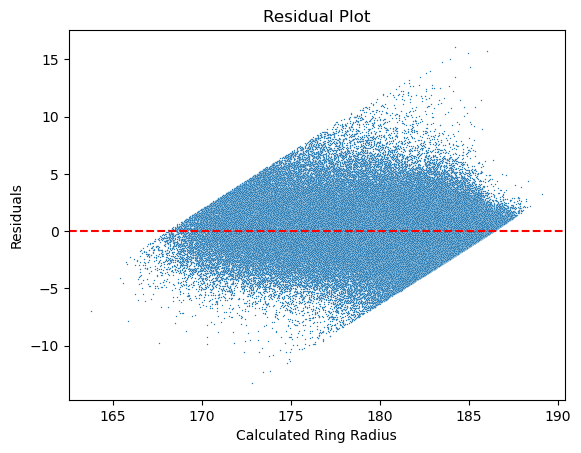

In [188]:
sns.scatterplot(data=pred_opt_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

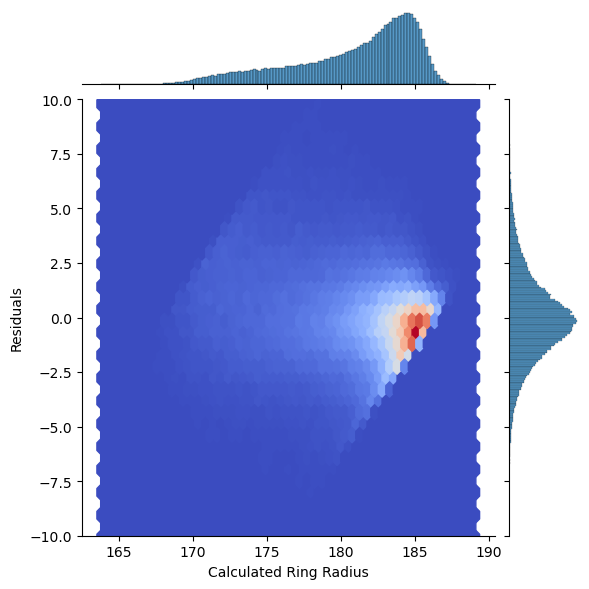

In [189]:
g = sns.jointplot(data=pred_opt_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim = (-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.3 Testing the model with `Dart Booster` 

In [68]:
xgb_dart = xgb.XGBRegressor(reg_lambda= 0.5,reg_alpha= 0.5, n_estimators= 500, max_depth= 6, learning_rate= 0.1, booster='dart')

In [180]:
xgb_dart.fit(X_train, y_train)

XGBRegressor(base_score=None, booster='dart', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [181]:
xgb_dart.score(X_train, y_train)

0.8151416747662007

In [70]:
xgb_dart.score(X_test, y_test)

0.7936925189651443

In [71]:
ypred_dart = xgb_dart.predict(X_test)


In [72]:
pred_dart_df = pd.DataFrame(ypred_dart, y_test).reset_index()
pred_dart_df.columns=['predicted_radius', 'theoretical_radius']
pred_dart_df['residual'] = pred_dart_df['theoretical_radius'] - pred_dart_df['predicted_radius']

Text(0, 0.5, 'Residuals')

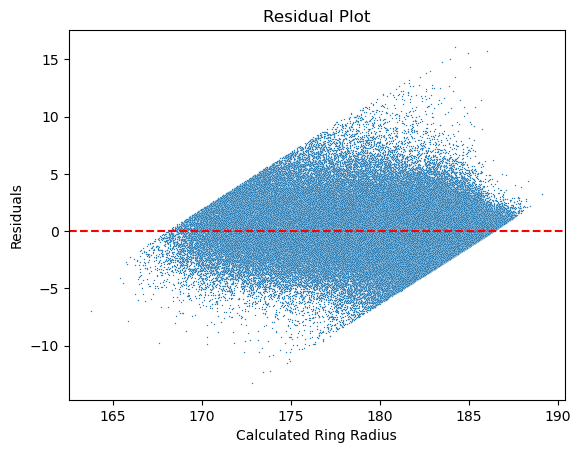

In [190]:
sns.scatterplot(data=pred_dart_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

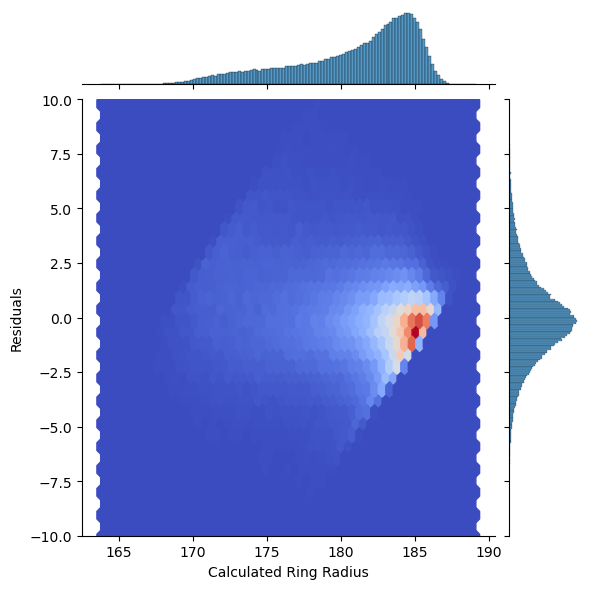

In [191]:
g = sns.jointplot(data=pred_dart_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.4 Transform the features using `PolynomialFeatures`

#### 4.4.1 Transforming the training data to a degree of 2 

In [75]:
from sklearn.preprocessing import PolynomialFeatures

deg = 2
poly_feats = PolynomialFeatures(degree=deg)
X_enc = poly_feats.fit_transform(X_train)
pd.DataFrame(X_enc, columns=poly_feats.get_feature_names_out()).head()

,1,x_realigned_min,x_realigned_max,y_realigned_min,y_realigned_max,min_hit_radius,max_hit_radius,mean_hit_radius,median_hit_radius,rms_hit_radius,...,x_max_diff^2,x_max_diff y_max_diff,x_max_diff max_x-min_x,x_max_diff max_y-min_y,y_max_diff^2,y_max_diff max_x-min_x,y_max_diff max_y-min_y,max_x-min_x^2,max_x-min_x max_y-min_y,max_y-min_y^2
0,1.0,-211.586070,130.413930,-183.036260,107.863742,56.925891,340.500829,219.493220,283.924682,238.984145,...,17007.793138,-19804.171682,44601.564060,37937.412535,23060.323748,-51934.840972,-44174.986426,116964.0,99487.800783,84622.811332
1,1.0,-202.968200,-49.968200,-185.629040,126.140960,11.688145,317.877675,192.619302,196.053626,217.029153,...,2496.821011,8496.544774,-7645.134600,-15578.585737,28913.275228,-26015.973167,-53013.071674,23409.0,47700.810070,97200.533185
2,1.0,-194.319394,165.680606,-174.787146,183.742852,24.658867,345.630501,226.378220,296.096886,255.114235,...,7170.805033,-13480.911135,30485.018160,30360.537566,25343.732568,-57310.974000,-57076.953995,129600.0,129070.799561,128543.760025
3,1.0,-213.126953,164.873047,-88.024355,176.975645,153.273552,200.831493,177.554417,187.358683,178.292066,...,27183.121627,8617.196223,62322.011766,43691.357455,2731.697697,19756.413989,13850.396051,142884.0,100170.000000,70225.000000
4,1.0,-187.761136,181.238864,-202.233659,140.716338,91.751927,299.036430,212.875239,236.724267,223.937030,...,797.433440,-5710.848786,10420.140816,9684.518323,40898.452743,-74624.220090,-69356.032661,136161.0,126548.548874,117614.700407


#### 4.4.2 Fitting and scoring on the data using the same optimized hyperparameters 

In [182]:
xgb_opt.fit(X_enc, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [184]:
xgb_opt.score(X_enc, y_train)

0.8331904998315839

In [77]:
X_test_enc = poly_feats.transform(X_test)

In [78]:
xgb_opt.score(X_test_enc, y_test)

0.8077597765417999

#### 4.4.3 Computing the residuals 

In [79]:
ypred_poly = xgb_opt.predict(X_test_enc)

In [80]:
pred_poly_df = pd.DataFrame(ypred_poly, y_test).reset_index()
pred_poly_df.columns=['predicted_radius', 'theoretical_radius']
pred_poly_df['residual'] = pred_poly_df['theoretical_radius'] - pred_poly_df['predicted_radius']

Text(0, 0.5, 'Residuals')

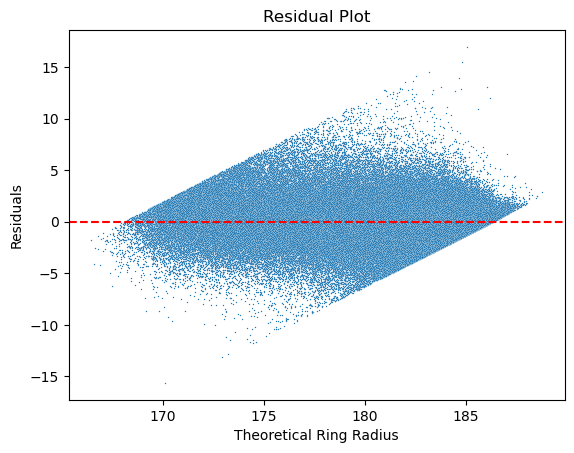

In [192]:
sns.scatterplot(data=pred_poly_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Theoretical Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

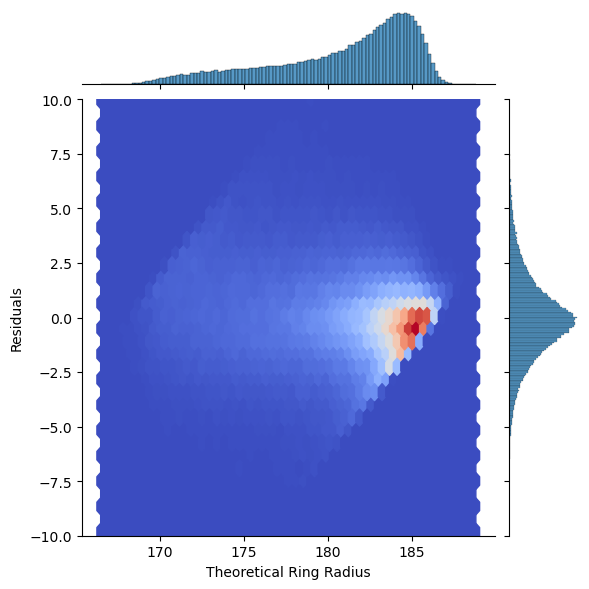

In [193]:
g = sns.jointplot(data=pred_poly_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Theoretical Ring Radius')
plt.ylabel('Residuals')

### 4.5 Testing the model on data subsetted on `max_y-min_y` and `rms_hit_radius` only


#### 4.5.1 Subsetting the data 

In [83]:
X_train_red = X_train[['max_y-min_y', 'rms_hit_radius']]
X_test_red = X_test[['max_y-min_y', 'rms_hit_radius']]

#### 4.5.2 Fitting the model using the same optimized hyperparameters

In [178]:
xgb_opt.fit(X_train_red, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

#### 4.5.3 Scoring on the train and test set

In [179]:
xgb_opt.score(X_train_red, y_train)

0.3602610630820474

In [85]:
xgb_opt.score(X_test_red, y_test)

0.3400976180206069

#### 4.5.4 Computing the residuals

In [86]:
ypred_red = xgb_opt.predict(X_test_red)

In [87]:
pred_red_df = pd.DataFrame(ypred_red, y_test).reset_index()
pred_red_df.columns=['predicted_radius', 'theoretical_radius']
pred_red_df['residual'] = pred_red_df['theoretical_radius'] - pred_red_df['predicted_radius']

Text(0, 0.5, 'Residuals')

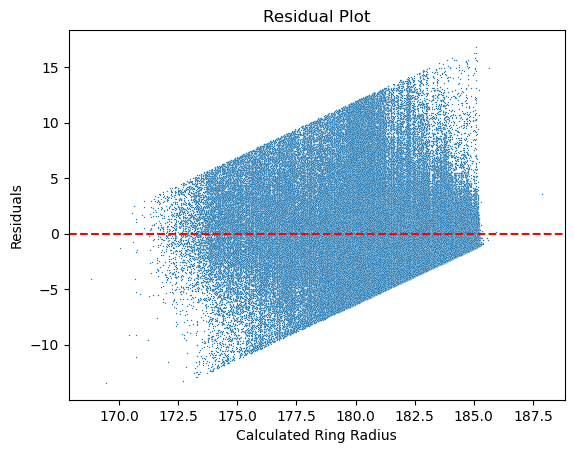

In [195]:
sns.scatterplot(data=pred_red_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

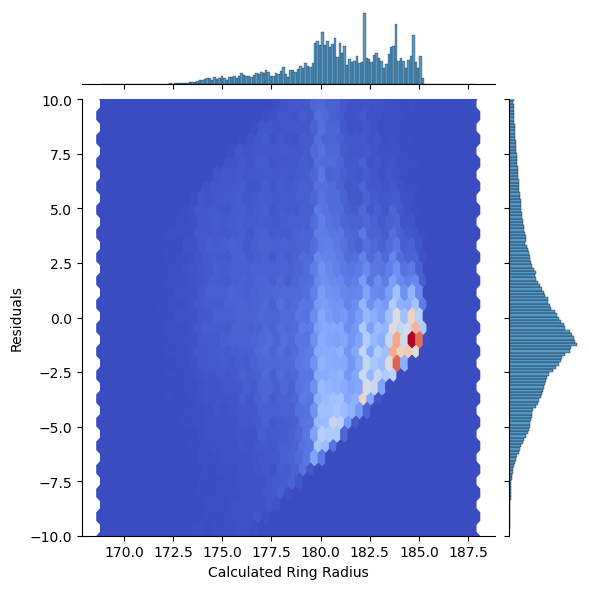

In [196]:
g = sns.jointplot(data=pred_red_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.6 Comparing the residual plot with ring radius calculated with SOTA 

#### 4.6.1 Data wrangling to include the SOTA radius into the dataset

In [91]:
sampled_data = pd.read_csv('../data/sampled_data.csv')

In [92]:
ring_radius_alg = sampled_data[['ring_radius']]

In [93]:
ring_radius_alg = grouped_hit_data.merge(ring_radius_alg, left_on='event', right_index=True)

#### 4.6.2 Computing the residuals

In [94]:
ring_radius_alg['residual'] = ring_radius_alg['ring_radius_cal'] - ring_radius_alg['ring_radius']

In [95]:
xgb_opt.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [96]:
ring_radius_alg['model_predicted_radius'] = xgb_opt.predict(ring_radius_alg.iloc[:, 1:20])

In [97]:
ring_radius_alg['residual_model'] = ring_radius_alg['ring_radius_cal'] - ring_radius_alg['model_predicted_radius']

#### Plotting residual from SOTA vs. residual from our model

/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_11053/1968060652.py:8: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[0]._sizes = [100]
/var/folders/v0/slk4rwcj0cz5hchw7hz83hlw0000gn/T/ipykernel_11053/1968060652.py:9: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  legend.legendHandles[1]._sizes = [100]


Text(0, 0.5, 'Residuals')

/Users/Jialing/opt/miniconda3/envs/591/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/Jialing/opt/miniconda3/envs/591/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


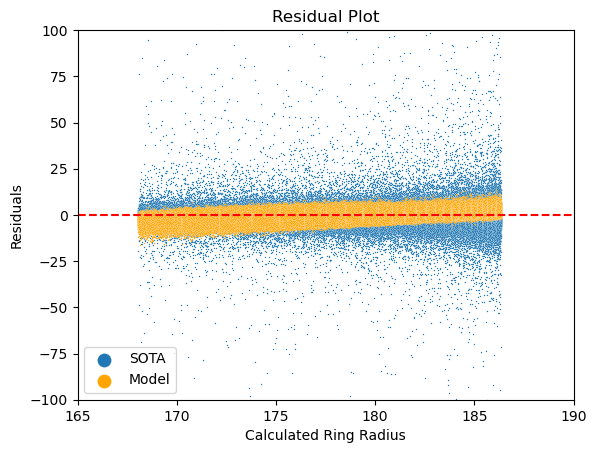

In [98]:
g = sns.scatterplot(data=ring_radius_alg, x='ring_radius_cal', y='residual', s=1, label='SOTA')
g = sns.scatterplot(data=ring_radius_alg, x='ring_radius_cal', y='residual_model', color = 'orange', s=1, label='Model')
plt.axhline(y=0, color='red', linestyle='--')
g.set(xlim = (165, 190))
g.set(ylim = (-100, 100))

legend = plt.legend()
legend.legendHandles[0]._sizes = [100]  
legend.legendHandles[1]._sizes = [100] 
plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.7 Plotting the `rms_hit_radius` vs. calculated ring radius and momentum

#### 4.7.1 Plotting `rms_hit_radius` vs. calculated ring radius

<Axes: xlabel='ring_radius_cal', ylabel='rms_hit_radius'>

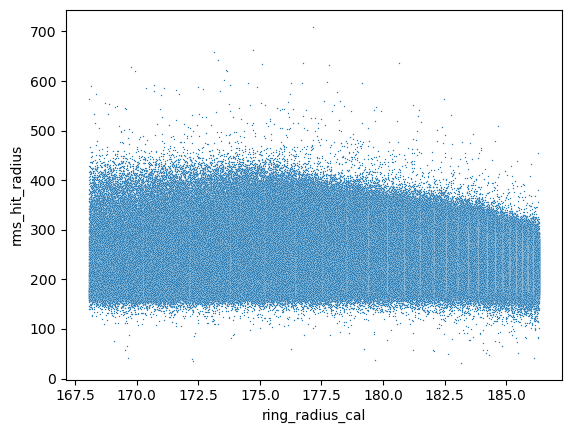

In [164]:
sns.scatterplot(data = grouped_hit_data, x = 'ring_radius_cal', y = 'rms_hit_radius', s=1)

Text(33.097222222222214, 0.5, 'RMS hit radius')

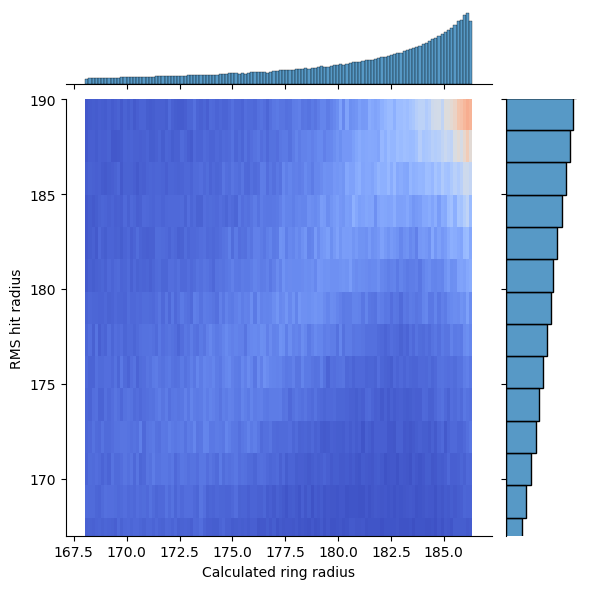

In [166]:
g = sns.jointplot(data = grouped_hit_data, x = 'ring_radius_cal', y = 'rms_hit_radius', kind='hist', cmap='coolwarm', ylim=(167, 190))

plt.xlabel('Calculated ring radius')
plt.ylabel('RMS hit radius')

#### 4.7.2 Plotting `rms_hit_radius` vs. `track_momentum`
- The calculated (theoretical) ring radius is coloured in red 

<Axes: xlabel='track_momentum', ylabel='rms_hit_radius'>

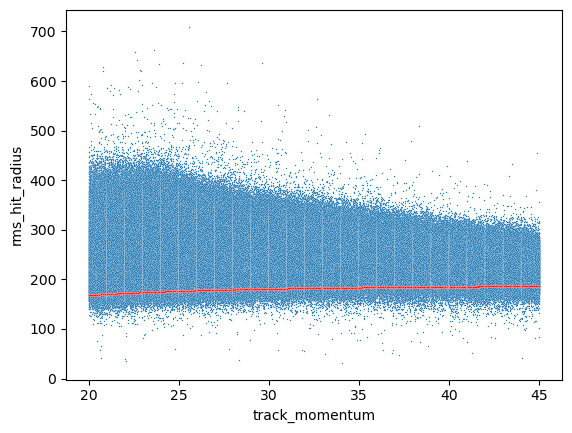

In [167]:
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'rms_hit_radius', s=1)
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'ring_radius_cal', color = 'red', s=1)

#### 4.7.3 Plotting `rms_hit_radius` vs. `track_momentum`
- The calculated (theoretical) ring radius is coloured in red

<Axes: xlabel='track_momentum', ylabel='rms_hit_radius'>

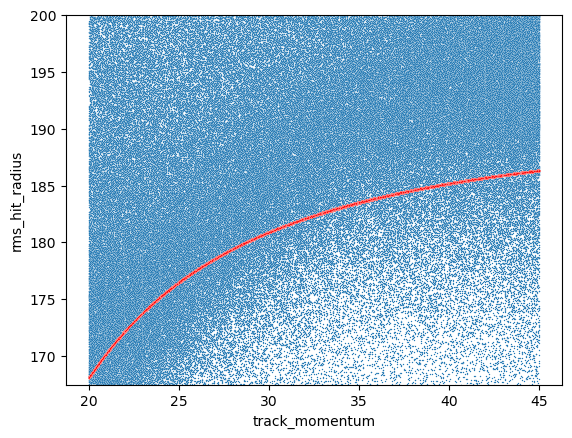

In [153]:
ploti = sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'rms_hit_radius', s=1)
sns.scatterplot(data = grouped_hit_data, x = 'track_momentum', y = 'ring_radius_cal', color = 'red', s=1)
ploti.set(ylim = (167.5, 200))
ploti

### 4.8 Plotting the distribution of residuals in radius bins 

#### 4.8.1 Cutting the predicted radius into 5 bins 

In [111]:
num_bins = 5
bin_edges = np.histogram_bin_edges(pred_df['predicted_radius'], bins=num_bins)

In [112]:
pred_df['radius_bin'] = pd.cut(pred_df['predicted_radius'], bins=bin_edges)

#### 4.8.2 Plotting the distribution of residuals 
- A density curve is used to show the distribution
- The 2.5% and 97.5% percentile bounds are labelled on each curve (covers 95% of the distribution)

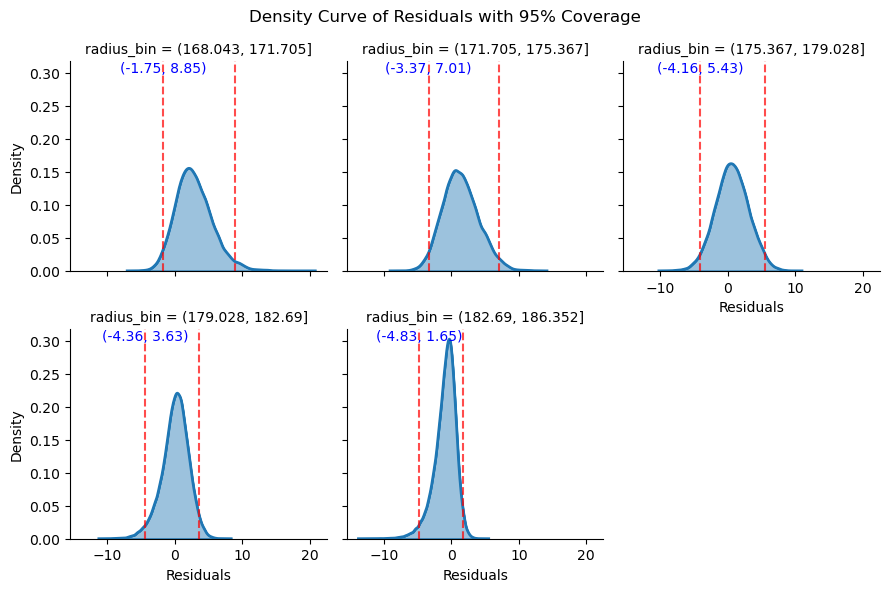

In [113]:
from scipy.stats import scoreatpercentile

g = sns.FacetGrid(pred_df, col='radius_bin', col_wrap=3)
g.map(sns.kdeplot, 'residual', fill=True)
g.map(sns.kdeplot, 'residual', lw=1)

def plot_density_curve(data, **kwargs):
    ax = plt.gca()
    p2_5 = scoreatpercentile(data, 2.5)
    p97_5 = scoreatpercentile(data, 97.5)
    
    sns.kdeplot(data, fill=True, ax=ax, **kwargs)
    sns.kdeplot(data, lw=2, ax=ax, **kwargs)
    ax.axvline(p2_5, color='red', linestyle='--', alpha=0.7, label='2.5% percentile')
    ax.axvline(p97_5, color='red', linestyle='--', alpha=0.7, label='97.5% percentile')
    ax.legend()
    ax.set_ylabel('Density')
    ax.text(p2_5, ax.get_ylim()[1], f'({p2_5:.2f}, {p97_5:.2f})', color='blue', va='top', ha='center')

g.map(plot_density_curve, 'residual')

g.set_axis_labels('Residuals', 'Density')

g.fig.suptitle('Density Curve of Residuals with 95% Coverage')

plt.tight_layout()

plt.show()

### 4.9 Sanity check with `RandomForestRegressor` 

#### 4.9.1 Fitting the model

In [114]:
from sklearn.ensemble import RandomForestRegressor

In [115]:
rf = RandomForestRegressor()

In [116]:
rf.fit(X_train, y_train)

RandomForestRegressor()

#### 4.9.2 Scoring on the test set

In [185]:
rf.score(X_train, y_train)

0.9649848974026755

In [117]:
rf.score(X_test, y_test)

0.7492294777725912

#### 4.9.3 Computing the residuals 

In [118]:
ypred_rf = rf.predict(X_test)


In [119]:
pred_rf_df = pd.DataFrame(ypred_rf, y_test).reset_index()
pred_rf_df.columns=['predicted_radius', 'theoretical_radius']
pred_rf_df['residual'] = pred_rf_df['theoretical_radius'] - pred_rf_df['predicted_radius']

Text(0, 0.5, 'Residuals')

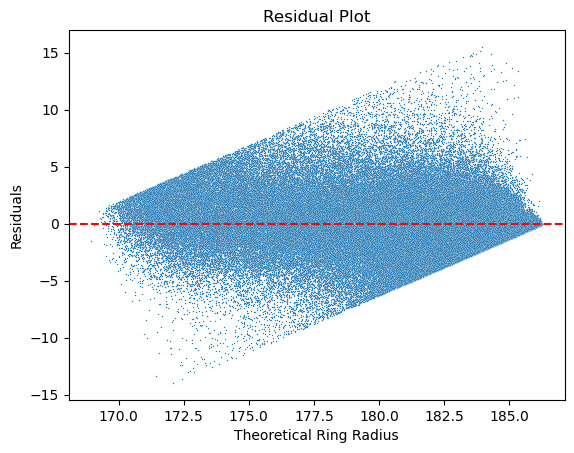

In [197]:
sns.scatterplot(data=pred_rf_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Theoretical Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

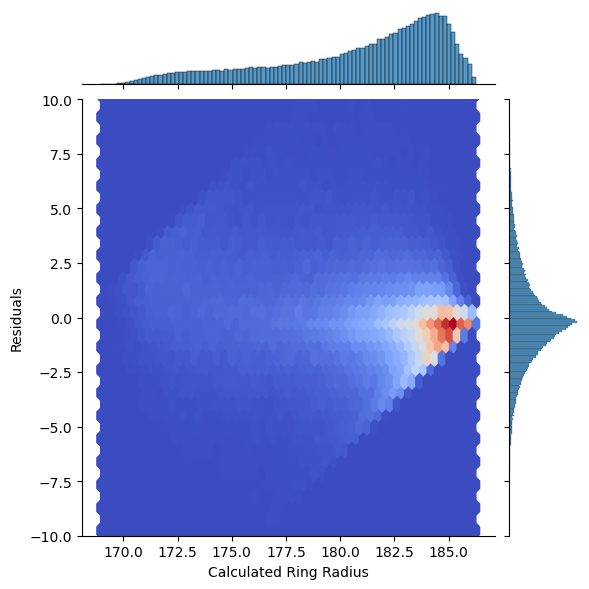

In [198]:
g = sns.jointplot(data=pred_rf_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

In [122]:
# rf_cv = cross_validate(rf, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [123]:
# pd.DataFrame(rf_cv)

### 4.10 `LightGBM`

#### 4.10.1 `LightGBM` with unscaled features 

In [124]:
from lightgbm.sklearn import LGBMRegressor

In [125]:
gbm = LGBMRegressor()

In [126]:
gbm.fit(X_train, y_train)

LGBMRegressor()

In [127]:
gbm_cv = cross_validate(gbm, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [128]:
pd.DataFrame(gbm_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,1.095708,0.238849,-2.492851,-2.471082,0.730796,0.737417
1,1.022805,0.167332,-2.498509,-2.472038,0.729560,0.737217
2,1.006392,0.156251,-2.486656,-2.464194,0.735070,0.738158
3,1.002655,0.151677,-2.489122,-2.466916,0.734599,0.737567
4,1.005993,0.158882,-2.492776,-2.465546,0.732726,0.738128


In [129]:
ypred_gbm = gbm.predict(X_test)


In [130]:
pred_gbm_df = pd.DataFrame(ypred_gbm, y_test).reset_index()
pred_gbm_df.columns=['predicted_radius', 'theoretical_radius']
pred_gbm_df['residual'] = pred_gbm_df['theoretical_radius'] - pred_gbm_df['predicted_radius']

Text(0, 0.5, 'Residuals')

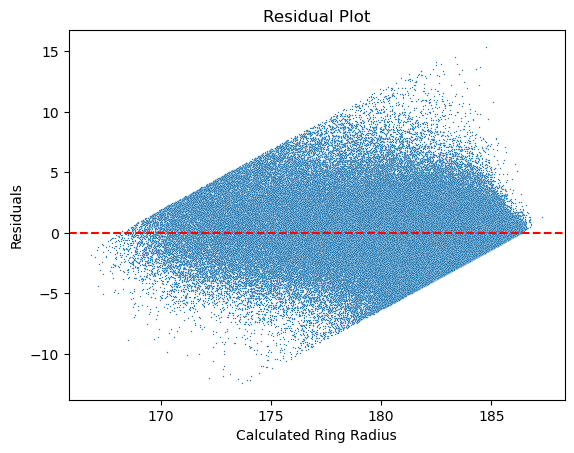

In [199]:
sns.scatterplot(data=pred_gbm_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

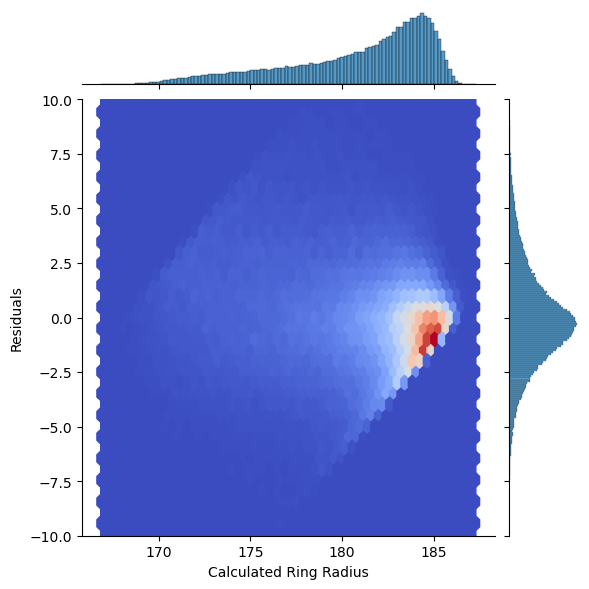

In [200]:
g = sns.jointplot(data=pred_gbm_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

#### 4.10.2 `LightGBM` with scaled features

In [132]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline

In [133]:
gbm_pipe = make_pipeline(StandardScaler(), LGBMRegressor())

In [134]:
gbm_pipe.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('lgbmregressor', LGBMRegressor())])

In [135]:
gbm_cv = cross_validate(gbm_pipe, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [136]:
pd.DataFrame(gbm_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,1.150226,0.188927,-2.487815,-2.463445,0.731882,0.739037
1,1.070679,0.159428,-2.492834,-2.468513,0.730787,0.737966
2,1.048146,0.155935,-2.492283,-2.469257,0.733870,0.737081
3,1.046282,0.163734,-2.488355,-2.463429,0.734762,0.738308
4,1.037850,0.205468,-2.488039,-2.459758,0.733741,0.739356


In [137]:
ypred_gbm_scaled = gbm_pipe.predict(X_test)


In [138]:
pred_gbm_scaled_df = pd.DataFrame(ypred_gbm_scaled, y_test).reset_index()
pred_gbm_scaled_df.columns=['predicted_radius', 'theoretical_radius']
pred_gbm_scaled_df['residual'] = pred_gbm_scaled_df['theoretical_radius'] - pred_gbm_scaled_df['predicted_radius']

Text(0, 0.5, 'Residuals')

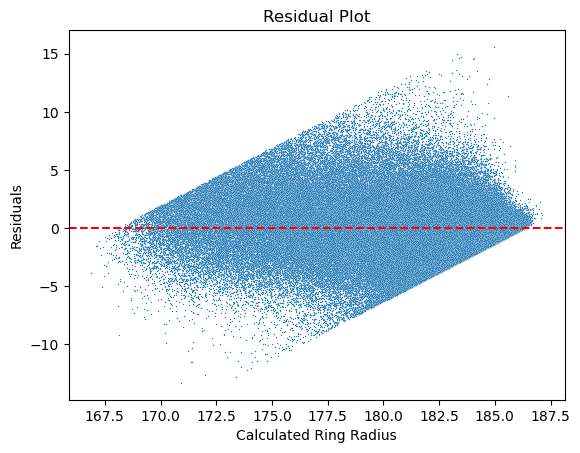

In [201]:
sns.scatterplot(data=pred_gbm_scaled_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

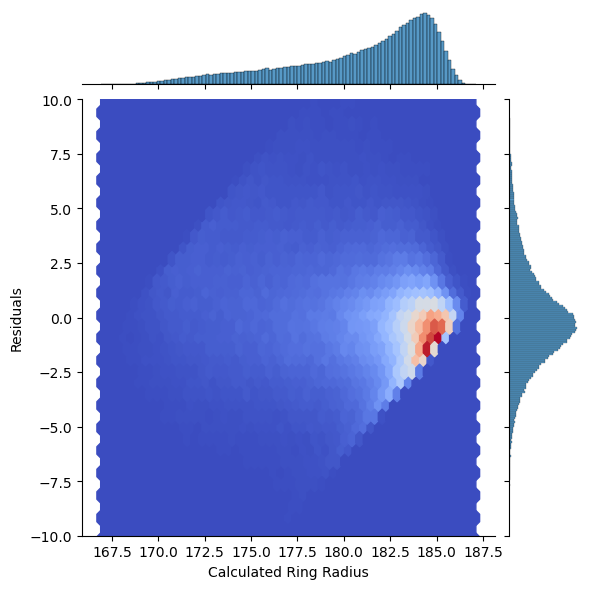

In [204]:
g = sns.jointplot(data=pred_gbm_scaled_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.11 `CatBoostRegressor`

In [141]:
from catboost import CatBoostRegressor

In [142]:
cbr = CatBoostRegressor(verbose=0)

In [143]:
cbr.fit(X_train, y_train)

In [144]:
cbr_cv = cross_validate(cbr, X_train, y_train, cv=5, return_train_score=True, scoring=reg_metrics)

In [145]:
pd.DataFrame(cbr_cv)

,fit_time,score_time,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_r2,train_r2
0,11.367159,0.042996,-2.230489,-2.191261,0.784479,0.793518
1,11.134184,0.049234,-2.233427,-2.190621,0.783901,0.793642
2,11.149480,0.038518,-2.244227,-2.191533,0.784209,0.792898
3,11.300732,0.040967,-2.240219,-2.192559,0.785023,0.792694
4,13.264203,0.054740,-2.238112,-2.188842,0.784546,0.793609


In [146]:
ypred_cbr = cbr.predict(X_test)

In [147]:
pred_cbr_df = pd.DataFrame(ypred_cbr, y_test).reset_index()
pred_cbr_df.columns=['predicted_radius', 'theoretical_radius']
pred_cbr_df['residual'] = pred_cbr_df['theoretical_radius'] - pred_cbr_df['predicted_radius']

Text(0, 0.5, 'Residuals')

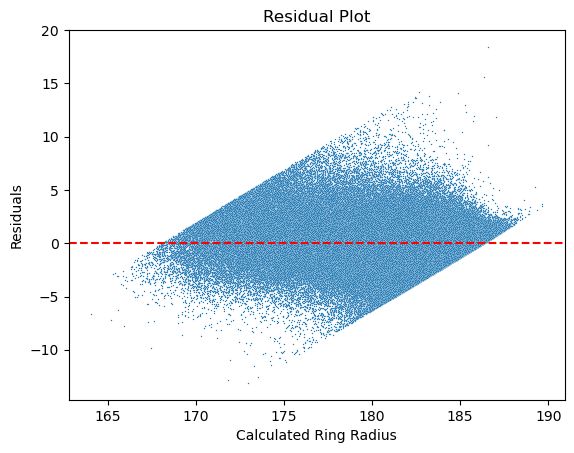

In [202]:
sns.scatterplot(data=pred_cbr_df, x='theoretical_radius', y='residual', s=1)
plt.axhline(y=0, color='red', linestyle='--')

plt.title('Residual Plot')
plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

Text(17.097222222222214, 0.5, 'Residuals')

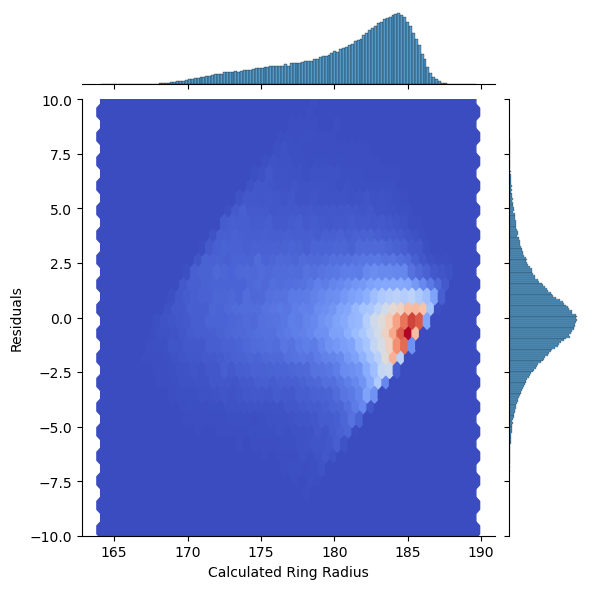

In [203]:
g = sns.jointplot(data=pred_cbr_df, x='theoretical_radius', y='residual', kind='hex', cmap='coolwarm', ylim=(-10, 10))

plt.xlabel('Calculated Ring Radius')
plt.ylabel('Residuals')

### 4.12 Correlation heatmap between features 

In [212]:
corr_df = grouped_hit_data.drop(columns=['event', 'track_momentum', 'ring_radius_cal', 'momentum_bin', 'radius_bin'])

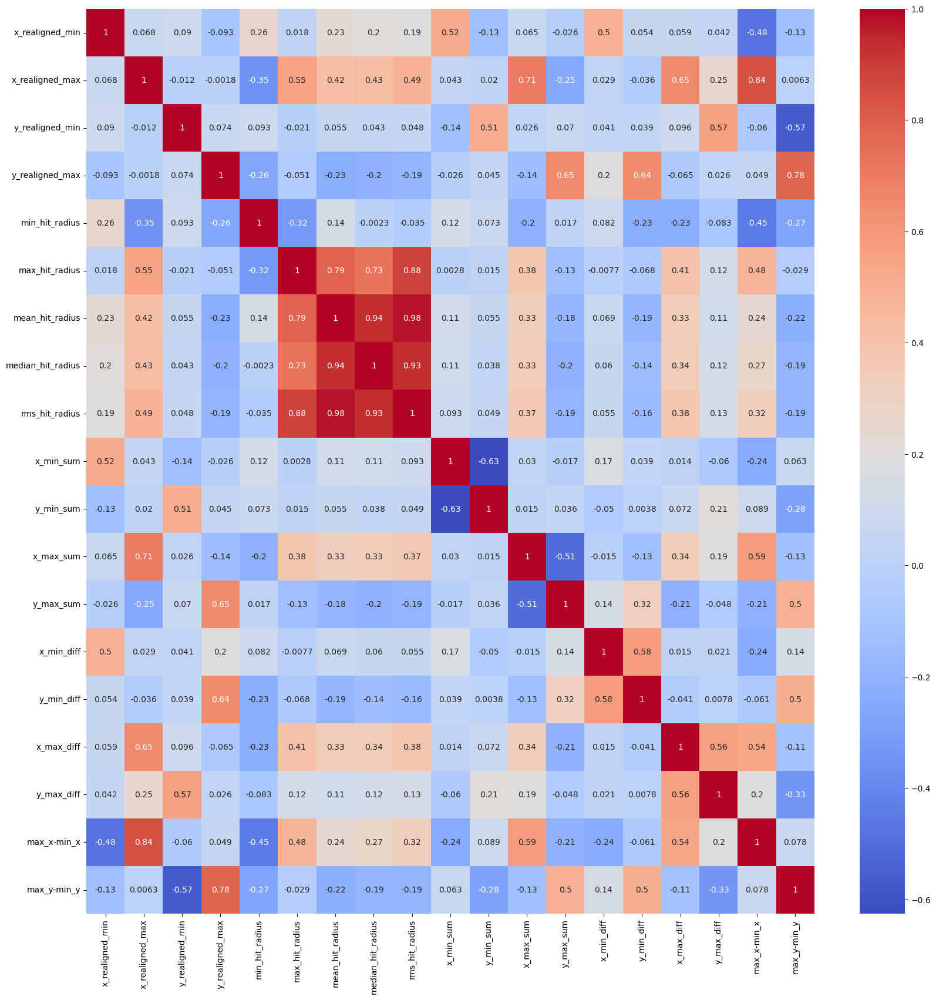

In [211]:
correlation_matrix = corr_df.corr()

plt.figure(figsize=(20, 20)) 

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

plt.show()

### 4.11 Summary 
- 4.1 Performance of `XGBRegressor` with default hyperparameters 

    - `XGBRegressor` with default hyperparameters exhibited a train score of 0.77 and test score of 0.79 
    

- 4.2 Hyperparameter optimization on `XGBRegressor`

    - The best parameters found by `RandomizedSearch` are 'reg_lambda': 0.5, 'reg_alpha': 0.5,'n_estimators': 500, 'max_depth': 6,'learning_rate': 0.1

- 4.3 Performance of optimized `XGBRegressor` with `Dart` booster 

    - The `XGBRegressor` with `Dart` booster exhibited a train score of 0.81 and test score of 0.79

- 4.4 Performance of optimized `XGBRegressor` with features transformed by `PolynomialFeatures` 

    - The `XGBRegressor` with features transformed to a degree of 2 exhibited a train score of 0.83 and test score of 0.81 

- 4.5 Performance of optimized `XGBRegressor` with top two important features only (`max_y-min_y` and `rms_hit_radius`) 

    - The `XGBRegressor` with only the top two important features exhibited a train score of 0.36 and test score of 0.34

- 4.6 Comparison of the residuals between the optimized `XGBRegressor` and SOTA

    - From the overlaid residual plots, it can be seen that the optimized `XGBRegressor` shows a thinner distribution in the residuals

- 4.7 Plots showing relationship between `track_momentum` and calculated ring radius vs. `rms_hit_radius`

    - More points are concentrated above the line indicating the calculated ring radius (in red)

- 4.8 Plots of residual ditribution from `XGBRegressor` in 5 radius bins 

    - It can be seen that the mean of the residuals shifts to the left as the radius increases, and the distribution becomes narrower 

- 4.9 Performance comparison with `RandomForestRegressor`

    - `RandomForestRegressor` with default hyperparameters exhibited a train score of 0.96 and a test score of 0.74

- 4.10 Performance comparison with `LightGBM`

    - `LightGBM` with default hyperparameters exhibited a train score of 0.74 and test score of 0.73

- 4.11 Performance comparison with `CatBoostRegressor` 

    - `CatBoostRegressor` with default hyperparameters exhibited a train score of 0.79 and test score of 0.78